# NGC 4258 (UGC 7353)

Галактика найдена из пересечения HYPERLEDA и https://arxiv.org/pdf/1608.06735v1.pdf.

In [1]:
from IPython.display import HTML
from IPython.display import Image
import os

%pylab
%matplotlib inline
%run ../../utils/load_notebook.py

Using matplotlib backend: Qt4Agg
Populating the interactive namespace from numpy and matplotlib


In [2]:
from photometry import *

importing Jupyter notebook from photometry.ipynb
Using matplotlib backend: Qt4Agg
Populating the interactive namespace from numpy and matplotlib


In [3]:
from instabilities import *

importing Jupyter notebook from instabilities.ipynb
Using matplotlib backend: Qt4Agg
Populating the interactive namespace from numpy and matplotlib


In [4]:
from utils import *

importing Jupyter notebook from utils.ipynb


In [5]:
name = 'N4258'
gtype = 'SABb' #LEDA, 'SBbc' from Heraudeau98
incl = 68.3  #LEDA, 56 здесь http://mnras.oxfordjournals.org/content/312/1/2.full.pdf
scale = 0.043 #kpc/arcsec according to NED

data_path = '../../data/n4258_u7353'
sin_i, cos_i = np.sin(incl*np.pi/180.), np.cos(incl*np.pi/180.)

In [6]:
%%javascript 
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

<h2 id="tocheading">Оглавление</h2>
<div id="toc"></div>

## Статьи

TODO: add arcticles

## Разное

In [7]:
os.chdir(data_path)

# Данные из NED
HTML('<iframe src=http://ned.ipac.caltech.edu/cgi-bin/objsearch?objname=ngc+4258&extend=no&hconst=\
73&omegam=0.27&omegav=0.73&corr_z=1&out_csys=Equatorial&out_equinox=J2000.0&obj_sort=RA+or+Longitude&of=pre_text&zv_breaker=\
30000.0&list_limit=5&img_stamp=YES width=1000 height=350></iframe>')

In [8]:
# Данные из HYPERLEDA
HTML('<iframe src=http://leda.univ-lyon1.fr/ledacat.cgi?o=ngc4258 width=1000 height=350></iframe>')

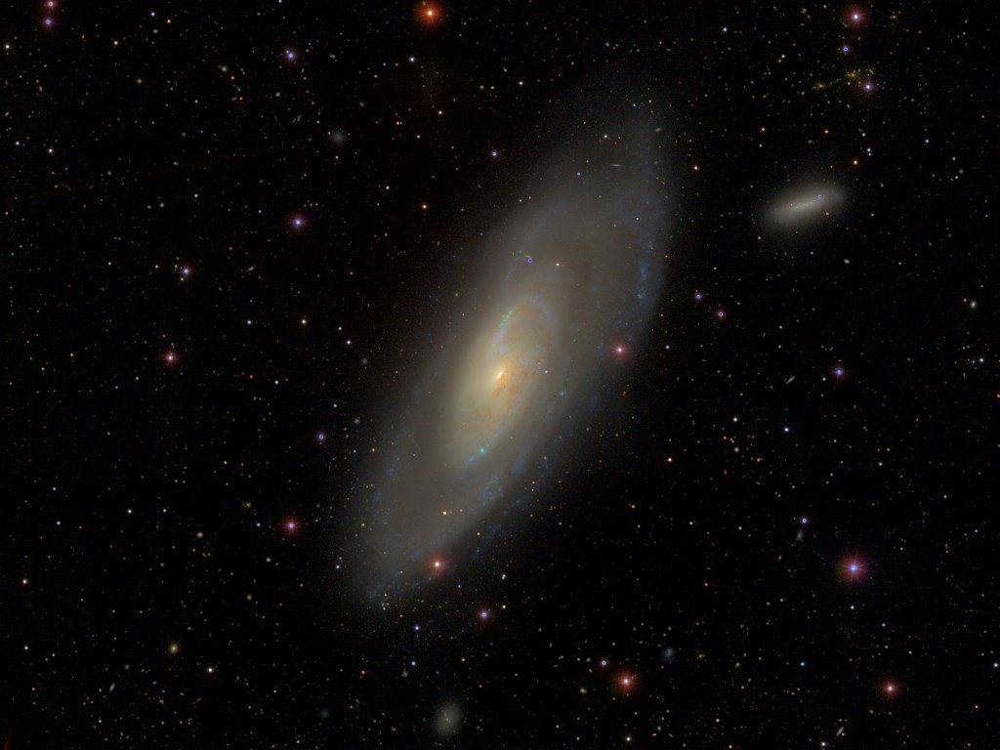

In [9]:
#SDSS
Image('n4258_SDSS.jpg', width=300)

Из выборки http://cosmo.nyu.edu/hogg/rc3/ с маштабом:

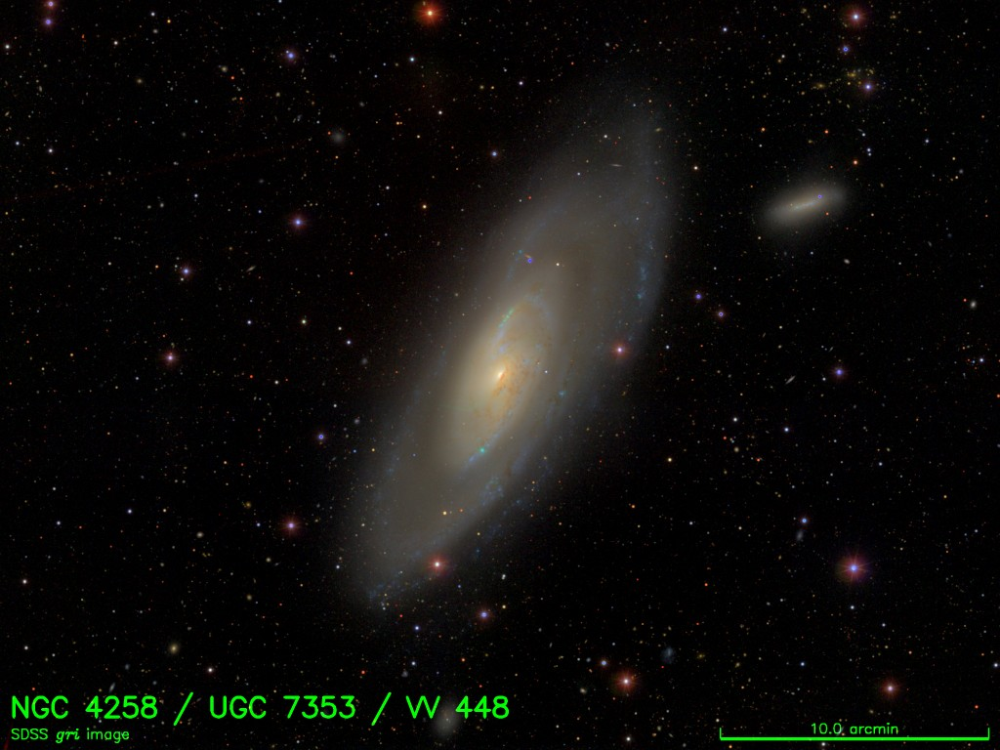

In [10]:
Image('n4258_SDSS_labeled.jpg', width=500)

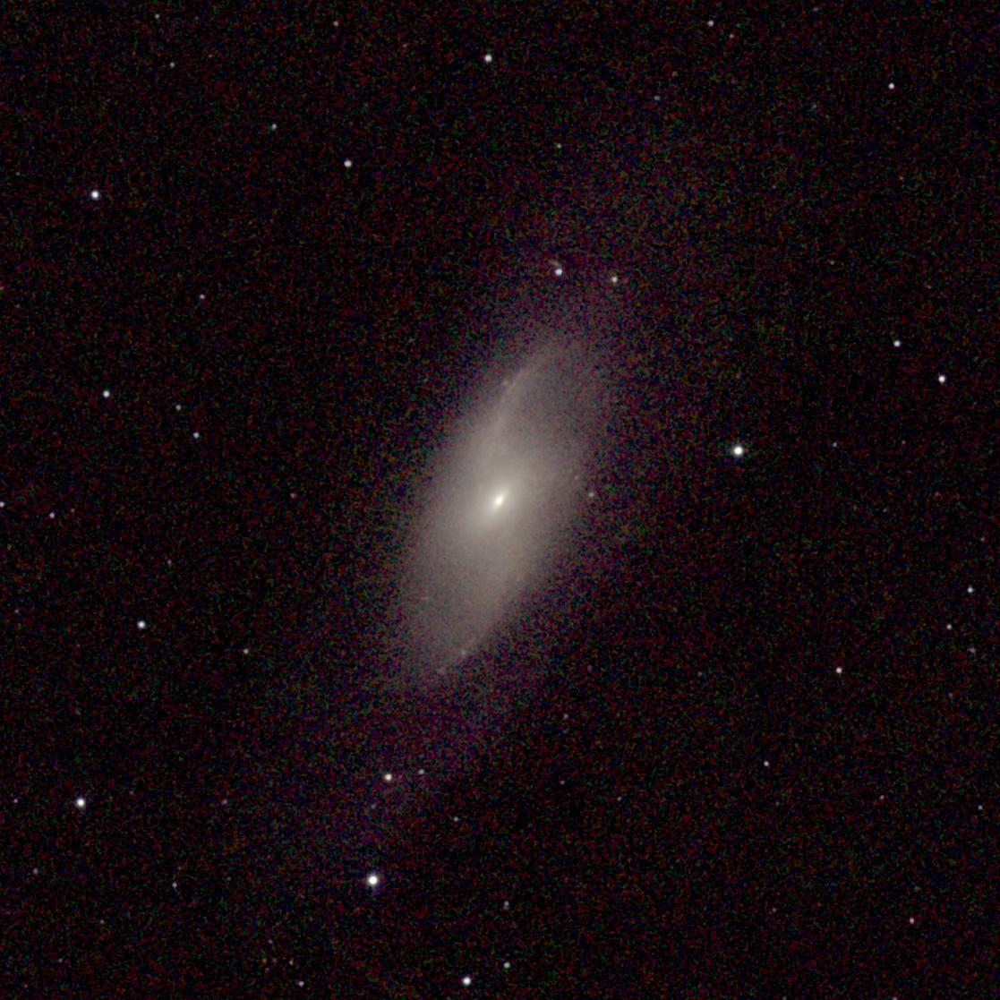

In [11]:
#JHK
Image('n4258_2MASS.jpg', width=300)

Также есть целых три фотографии со SPITZER+Chandra с невидимыми спиралями:
- http://www.spitzer.caltech.edu/images/1764-ssc2007-06a-Anomalous-Arms-Spiral-Galaxy-M106
- http://www.spitzer.caltech.edu/images/5910-sig14-020a-Black-Hole-Jets-Make-Shock-Waves
- http://www.spitzer.caltech.edu/images/5907-sig14-020-Galactic-Pyrotechnics-on-Display

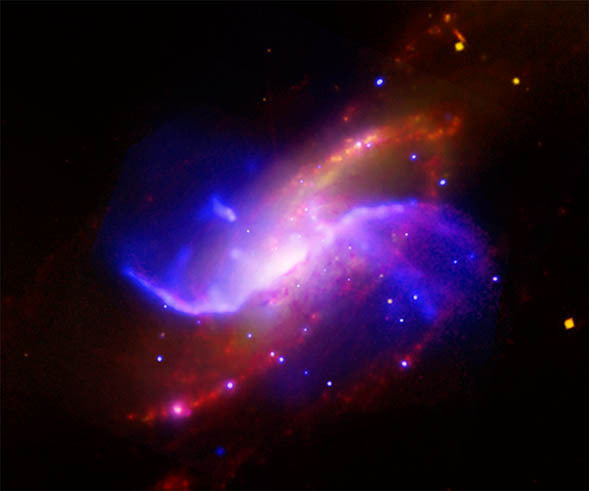

In [12]:
Image('http://www.spitzer.caltech.edu/uploaded_files/graphics/high_definition_graphics/0008/2016/ssc2007-06a_Ti.jpg', width=300)

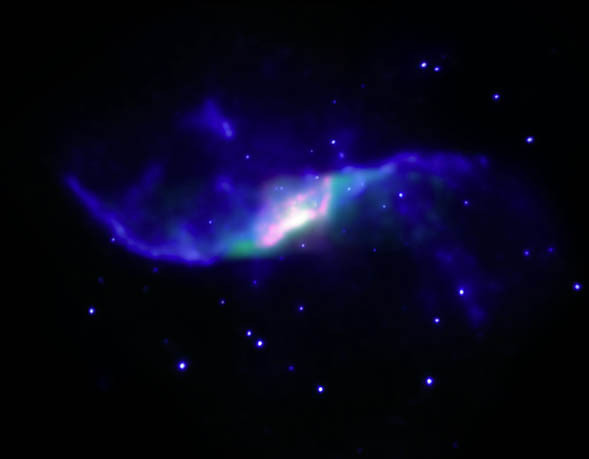

In [13]:
Image('http://www.spitzer.caltech.edu/uploaded_files/graphics/high_definition_graphics/0010/1167/sig14-020a_Inline.jpg', width=300)

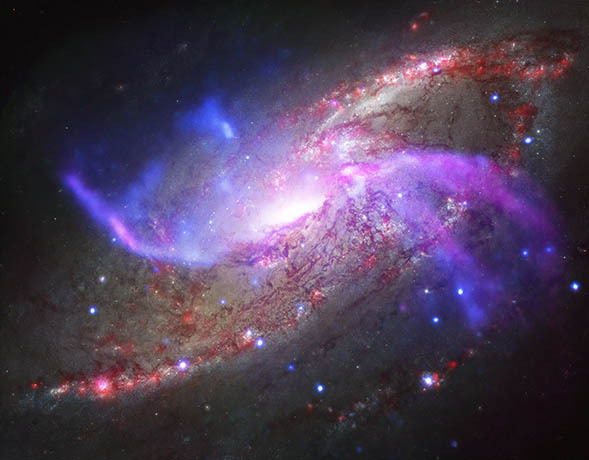

In [14]:
Image('http://www.spitzer.caltech.edu/uploaded_files/graphics/high_definition_graphics/0010/1185/sig14-020_Inline.jpg', width=300)

А также просто куча (~1500) изображений с HST, я правда хорошего там не нашел.

Вот в этой статье https://arxiv.org/pdf/1612.05655.pdf есть ссылка на величину R25 (примерно 9 минут или 20 кпк), а также картинка (возможно в $K$) со скоплениями:

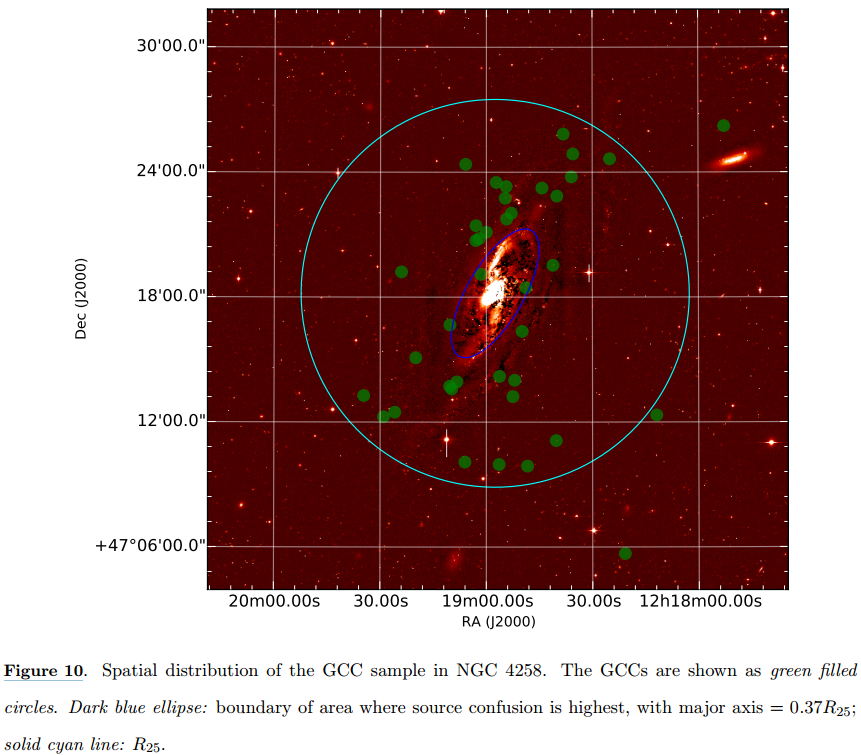

In [15]:
Image('GCC_and_R25.png')

## Кинематические данные по звездам

Дисперсии скоростей и кривая вращения - есть в Heraudeau 1998 http://adsabs.harvard.edu/cgi-bin/bib_query?1998A%26AS..133..317H до ~ 50'' (1 разрез), PA=$150^{\circ}$

#TODO: понять, исправлено ли за наклон

### Кривая вращения

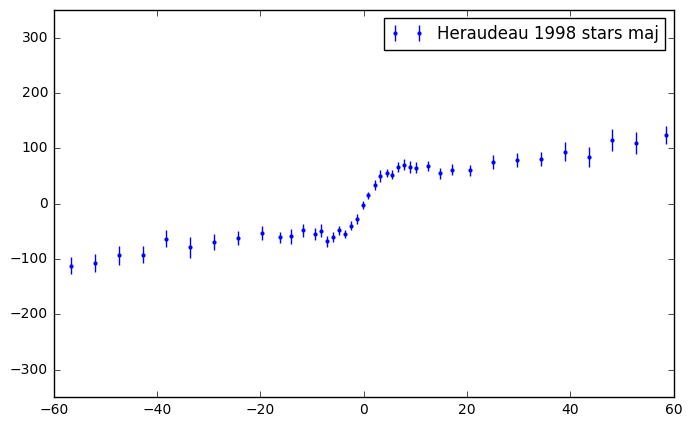

In [16]:
# Данные по звездной кинематике Heraudeau+1998 вдоль большой полуоси (не исправленные за наклон?) - из HYPERLEDA
r_ma, vel_ma, e_vel_ma, sig_ma, e_sig_ma = zip(*np.loadtxt("her98_kinem.dat", float))

fig = plt.figure(figsize=[8,5])
plt.errorbar(r_ma, vel_ma, e_vel_ma, fmt='.', marker='.', mew=0, label="Heraudeau 1998 stars maj")
plt.legend()
plt.ylim(-350., 350.)
plt.show()

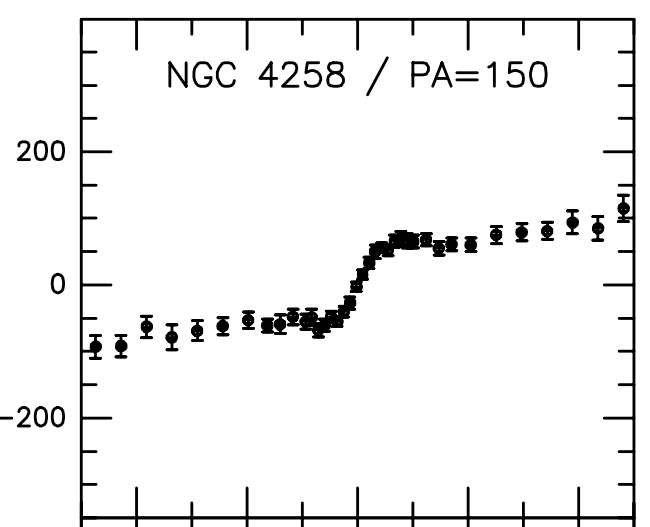

In [17]:
Image('her98_rot.png') #оригинал

Приближение:

In [18]:
r_ma_b, vel_ma_b, e_vel_b = zip(*sorted(zip(np.abs(r_ma), np.abs(vel_ma), e_vel_ma)))

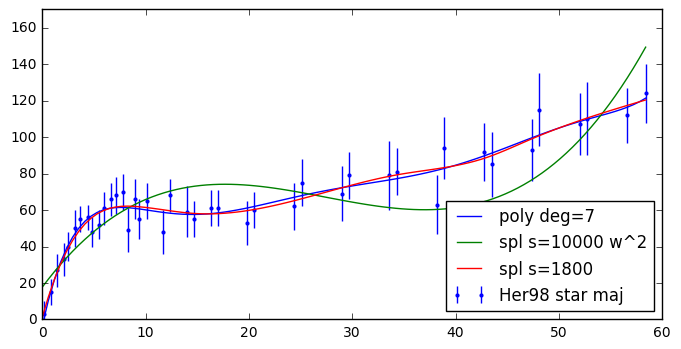

In [19]:
# %%time
fig = plt.figure(figsize=[8,4])
plt.errorbar(r_ma_b, vel_ma_b, yerr=e_vel_b, fmt='.', marker='.', mew=0, color='blue', label = 'Her98 star maj')

test_points = np.linspace(0.0, max(r_ma_b), 100)

poly_star = poly1d(polyfit(r_ma_b, vel_ma_b, deg=7))
plt.plot(test_points, poly_star(test_points), '-', label='poly deg=7')

def w(arr):
    return map(lambda l: 1/(1. + l**2), arr)

import scipy.interpolate as inter

spl = inter.UnivariateSpline(r_ma_b, vel_ma_b, k=3, s=10000., w=w(e_vel_b))
plt.plot(test_points, spl(test_points), '-', label='spl s=10000 w^2')

spl = inter.UnivariateSpline(r_ma_b, vel_ma_b, k=3, s=1800.)
plt.plot(test_points, spl(test_points), '-', label='spl s=1800')

plt.legend(loc='lower right')
plt.ylim(0, 170)
plt.show()

C весами плохо получается, полином и обычный почти совпадают - берем их:

In [20]:
star_approx = spl

### Дисперсии

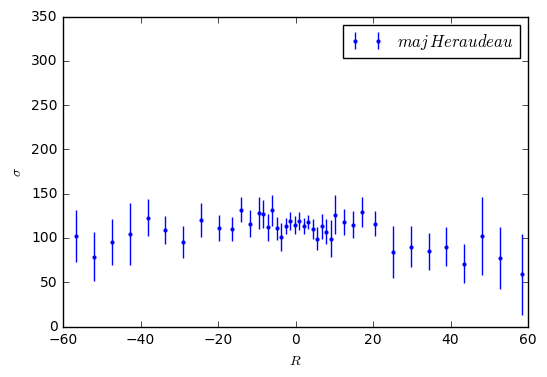

In [21]:
r_sig_ma = r_ma #Heraudeau+1998

fig = plt.figure(figsize=[6., 4.])
plt.errorbar(r_sig_ma, sig_ma, yerr=e_sig_ma, fmt='.', marker='.', mew=0, color='blue', label=r'$maj\, Heraudeau $')

plt.xlabel('$R$')
plt.ylabel('$\sigma$')
plt.ylim(0, 350)
plt.legend()
plt.show()

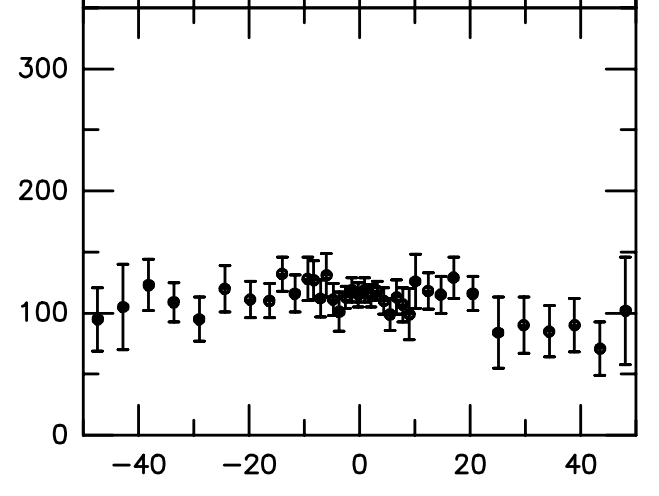

In [22]:
Image('her98_sig.png') #из статьи

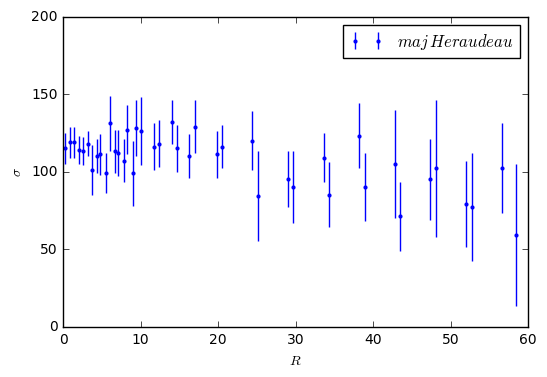

In [23]:
r_sig_ma = map(abs, r_sig_ma)

fig = plt.figure(figsize=[6., 4.])
plt.errorbar(r_sig_ma, sig_ma, yerr=e_sig_ma, fmt='.', marker='.', mew=0, color='blue', label=r'$maj\, Heraudeau $')
plt.xlabel('$R$')
plt.ylabel('$\sigma$')
plt.ylim(0, 200)
plt.legend()
plt.show()

Для большой оси: $\sigma^2_{maj} = \sigma^2_{\varphi}\sin^2 i + \sigma^2_{z}\cos^2 i$, следовательно примерные ограничения
$$\sigma_{maj}  < \frac{\sigma_{maj}}{\sqrt{\sin^2 i + 0.49\cos^2 i}}< \sigma_R = \frac{\sigma_{maj}}{\sqrt{f\sin^2 i + \alpha^2\cos^2 i}} ~< \frac{\sigma_{maj}}{\sqrt{0.5\sin^2 i + 0.09\cos^2 i}} < \frac{\sqrt{2}\sigma_{maj}}{\sin i} (или \frac{\sigma_{maj}}{\sqrt{f}\sin i}),$$ 
или можно более точную оценку дать, если построить $f$ (сейчас $0.5 < f < 1$).

Для малой оси: $\sigma^2_{min} = \sigma^2_{R}\sin^2 i + \sigma^2_{z}\cos^2 i$ и ограничения
$$\sigma_{min} < \frac{\sigma_{min}}{\sqrt{\sin^2 i + 0.49\cos^2 i}} < \sigma_R = \frac{\sigma_{min}}{\sqrt{\sin^2 i + \alpha^2\cos^2 i}} ~< \frac{\sigma_{min}}{\sqrt{\sin^2 i + 0.09\cos^2 i}} < \frac{\sigma_{min}}{\sin i}$$ 

Соответственно имеем 5 оценок из maj и 4 оценки из min.

У нас только большая - приближаем по ней.

In [24]:
spl_maj = inter.UnivariateSpline(r_sig_ma, sig_ma, k=3, s=10000.)
sig_maj_lim = max(r_sig_ma)

points = np.linspace(0.1, max(r_ma)+15., 100)

In [25]:
# TODO: find way to move to external file
@flat_end(sig_maj_lim)
def sig_R_maj_minmin(r, spl_maj=spl_maj):
    return spl_maj(r).item()

@flat_end(sig_maj_lim)
def sig_R_maj_min(r, spl_maj=spl_maj):
    return spl_maj(r).item()/sqrt(sin_i**2 + 0.49*cos_i**2)
    
@flat_end(sig_maj_lim)
def sig_R_maj_max(r, spl_maj=spl_maj):
    return spl_maj(r).item()/sqrt(0.5*sin_i**2 + 0.09*cos_i**2)

@flat_end(sig_maj_lim)
def sig_R_maj_maxmax(r, spl_maj=spl_maj):
    return spl_maj(r)*sqrt(2)/sin_i
    
@flat_end(sig_maj_lim)
def sig_R_maj_maxmaxtrue(r, spl_maj=spl_maj):
    return spl_maj(r)/sin_i/sqrt(sigPhi_to_sigR_real(r))

Используем соотношение $\sigma_{\varphi}^{2}/\sigma_{R}^{2}$, которое описывается уравнением ${\displaystyle \sigma_{\varphi}^{2}/\sigma_{R}^{2}=0.5\left(1+\frac{R}{\bar{v}_{\varphi}}\frac{d\bar{v}_{\varphi}}{dR}\right)}$ (Binney & Tremaine, 1987)

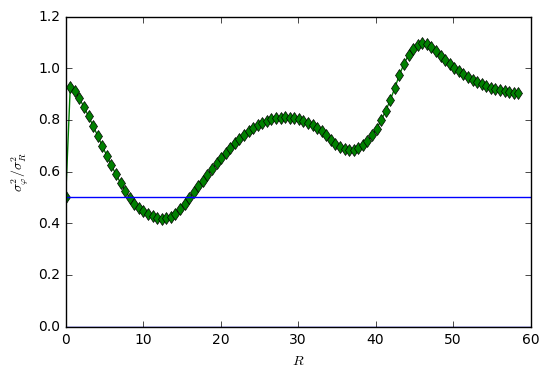

In [26]:
def sigPhi_to_sigR_real(R):
        return 0.5 * (1 + R*star_approx.derivative()(R) / star_approx(R))

plt.plot(test_points, [sigPhi_to_sigR_real(R) for R in test_points], 'd-', color='green')
plt.axhline(y=0.5)
plt.axhline(y=0.0)
plt.xlabel('$R$')
plt.ylabel(r"$\sigma_{\varphi}^2/\sigma_{R}^2$")
plt.ylim(0)
plt.show()

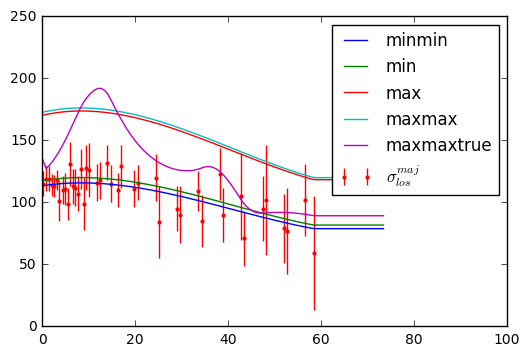

In [27]:
plt.errorbar(r_sig_ma, sig_ma, yerr=e_sig_ma, fmt='.', marker='.', mew=0, color='red', label='$\sigma_{los}^{maj}$')
plt.plot(points, map(sig_R_maj_minmin, points), label = 'minmin')
plt.plot(points, map(sig_R_maj_min, points), label = 'min')
plt.plot(points, map(sig_R_maj_max, points), label = 'max')
plt.plot(points, map(sig_R_maj_maxmax, points), label = 'maxmax')
plt.plot(points, map(sig_R_maj_maxmaxtrue, points), label = 'maxmaxtrue')

plt.legend()
plt.ylim(0,250)
plt.xlim(0,100)
plt.show()

Видно, что оценки почти не отличаются, только "настоящая" близка и к одной и к другой.

## Данные по газу

### Кривая вращения

* есть по $\rm{CO}$ тут http://iopscience.iop.org/article/10.1086/511762/pdf
* есть по $\rm{HI}$ тут http://www.aanda.org/articles/aa/pdf/2011/06/aa16177-10.pdf
* по СO + HI http://articles.adsabs.harvard.edu/cgi-bin/nph-iarticle_query?1997PASJ...49...17S&amp;data_type=PDF_HIGH&amp;whole_paper=YES&amp;type=PRINTER&amp;filetype=.pdf

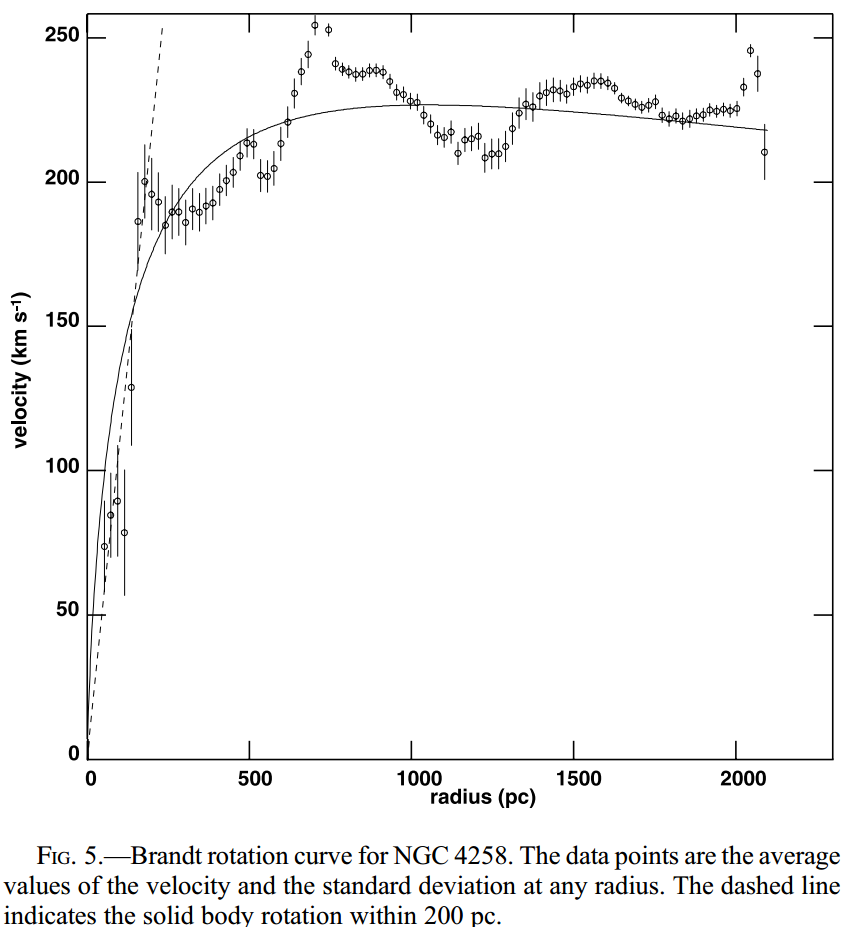

In [28]:
Image('CO_rot.png') #from Sawada-Satoh 2007, правда [P.A.] = 86 

(0, 2250.0)

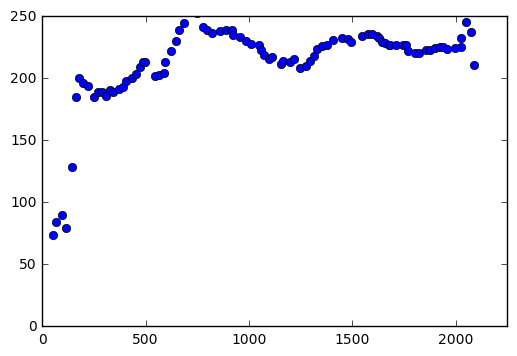

In [29]:
# Данные по кинематике газа Sawada-Satoh 2007 в CO
r_co, vel_co = zip(*np.loadtxt("CO_rot.dat", float, delimiter=','))
plt.plot(r_co, vel_co, 'o', label='CO Sawada-Satoh 2007')
plt.ylim(0, 250)
plt.xlim(0, 2250.)

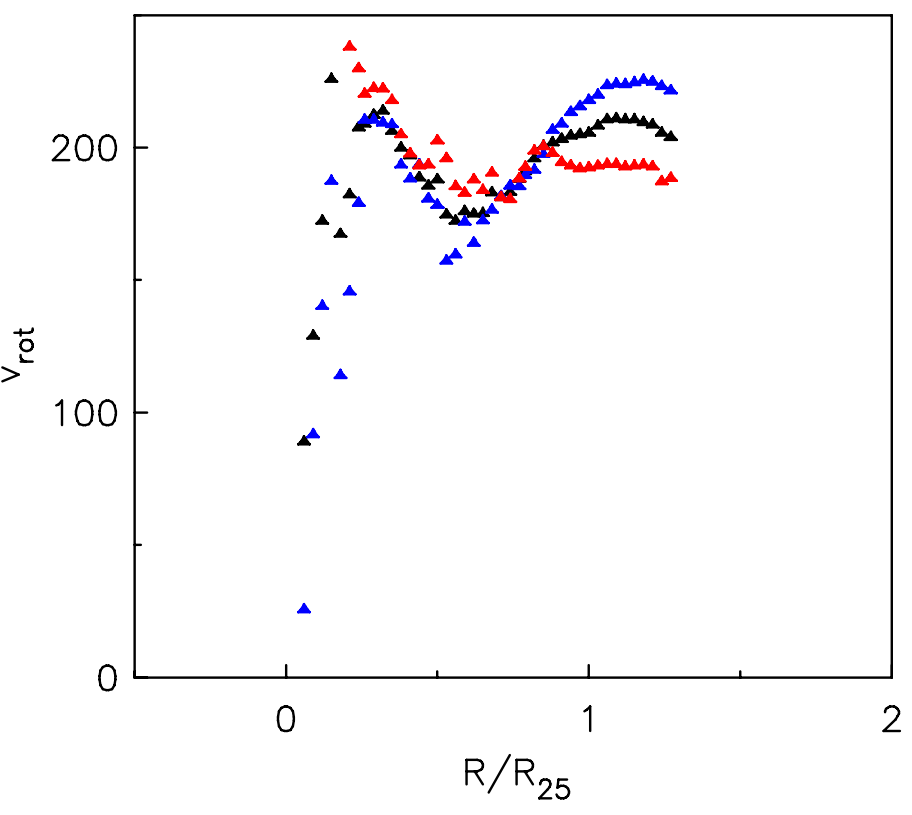

In [30]:
Image('HI_rot.png') #HI WHISP from van Eymeren 2011, PA=331(-180=151, все ок), R25=19.46kpc, разные цвета - это две стороны, черная - усредненная

(-0.5, 2.0)

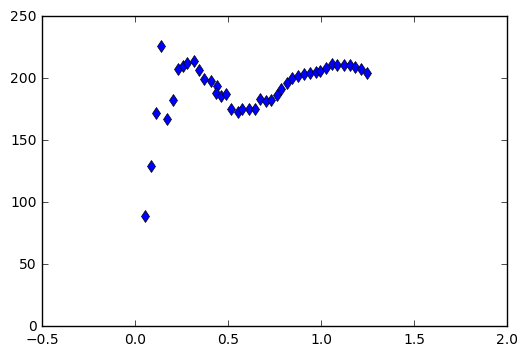

In [31]:
R25 = 19.46

# Данные по кинематике газа van Eymeren 2011 в HI
r_hi, vel_hi = zip(*np.loadtxt("HI_rot.dat", float, delimiter=','))
plt.plot(r_hi, vel_hi, 'd', label='HI Eymeren+2011')
plt.ylim(0, 250)
plt.xlim(-0.5, 2.)

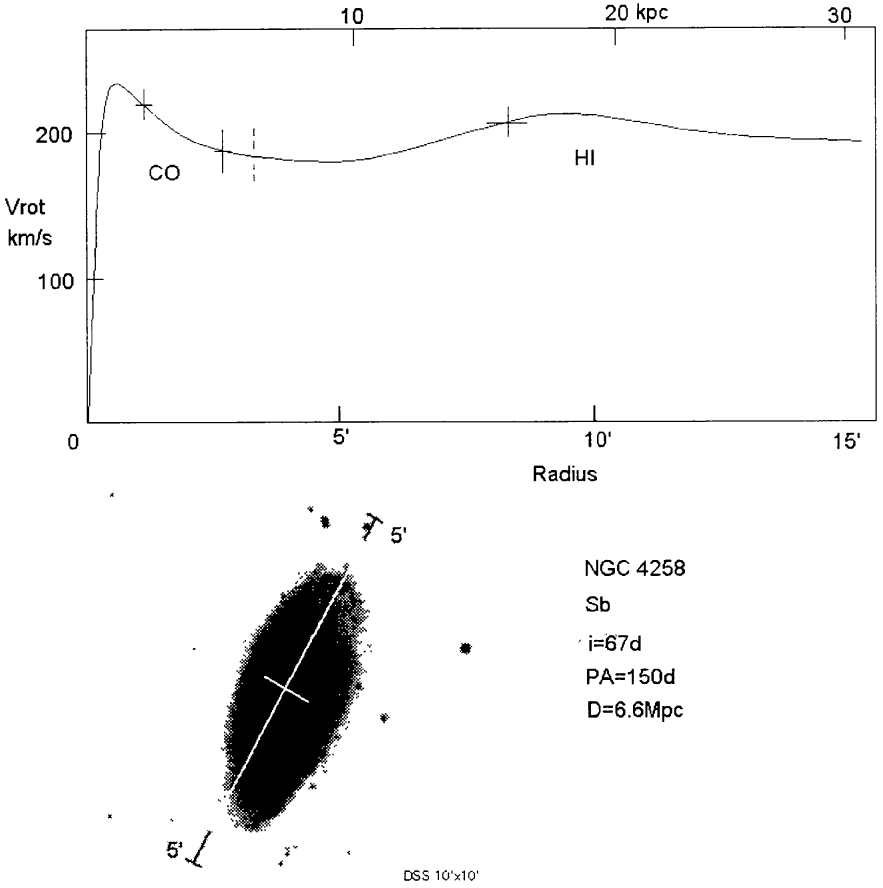

In [32]:
Image('CO_HI_rot.png') # CO+HI Sofue 97

Тут точки не самое ценное, видно как ось проходит зато.

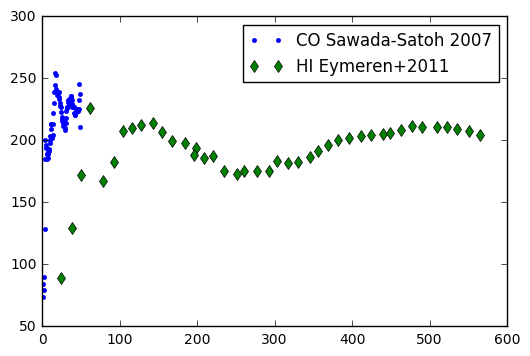

In [33]:
plt.plot([l/1000./scale for l in r_co], vel_co, '.', label='CO Sawada-Satoh 2007')
plt.plot([l*R25/scale for l in r_hi], vel_hi, 'd', label='HI Eymeren+2011')
plt.legend()

Непонятно, что брать. Видимо с учетом того, что у $CO$ странный позиц. угол - берем $HI$:

In [34]:
r_hi = [l*R25/scale for l in r_hi]
r_co = [l/1000./scale for l in r_co]

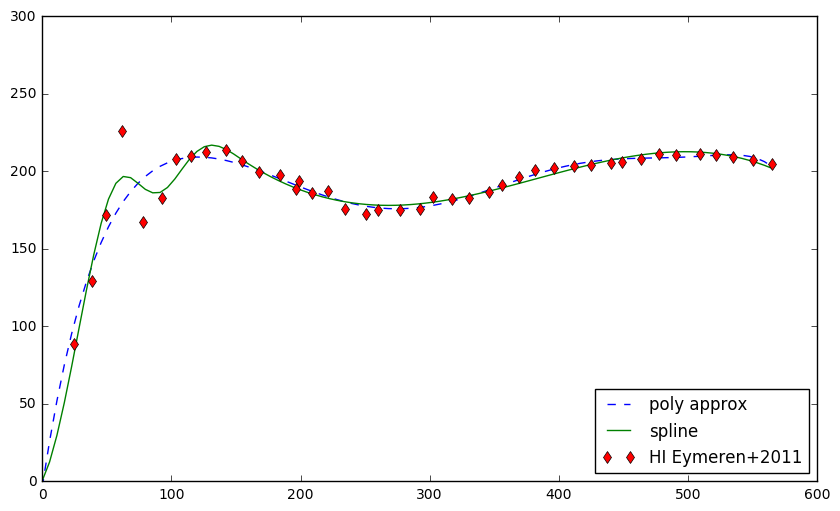

In [35]:
fig = plt.figure(figsize=[10,6])
_1,_2, = [0.0,],[0.0,]
_1.extend(r_hi)
_2.extend(vel_hi)
_1,_2 = zip(*sorted(zip(_1,_2)))

gas_approx = poly1d(polyfit(_1, _2, deg=9))
test_points = np.linspace(0, max(r_hi), 100)
plt.plot(test_points, gas_approx(test_points), '--', label='poly approx')

spl_gas = inter.UnivariateSpline(_1, _2, k=3, s=2000.)
plt.plot(test_points, spl_gas(test_points), '-', label='spline')

plt.plot(r_hi, vel_hi, 'd', label='HI Eymeren+2011')

plt.ylim(0, 300)
plt.legend(loc='lower right')
plt.show()

А вот такой результат для $CO$ + HI:

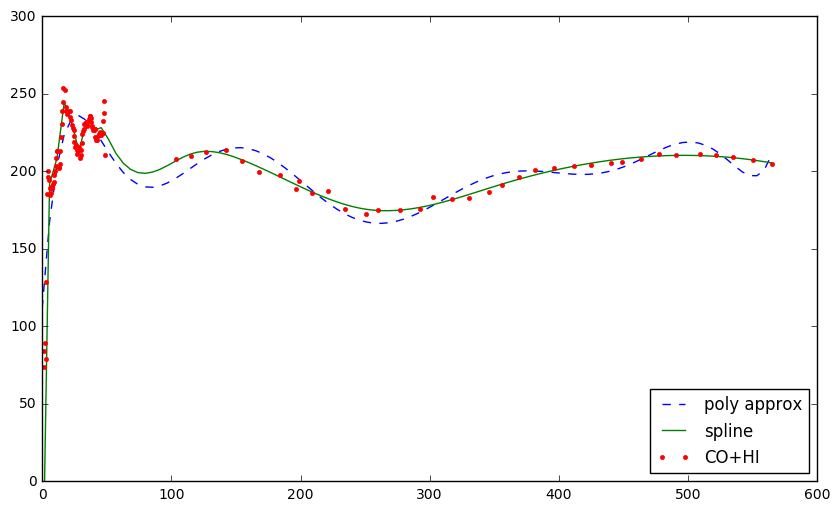

In [36]:
_1,_2 = zip(*filter(lambda l: l[0] > 100., zip(r_hi, vel_hi)))
_1 = list(r_co) + list(_1)
_2 = list(vel_co) + list(_2)

fig = plt.figure(figsize=[10,6])

gas_approx = poly1d(polyfit(_1, _2, deg=9))
test_points = np.linspace(0, max(r_hi), 100)
plt.plot(test_points, gas_approx(test_points), '--', label='poly approx')

spl_gas = inter.UnivariateSpline(_1, _2, k=3, s=2000.)
plt.plot(test_points, spl_gas(test_points), '-', label='spline')

# plt.plot(r_co, vel_co, 'd', label='CO')
plt.plot(_1, _2, '.', label='CO+HI')

plt.ylim(0, 300)
plt.legend(loc='lower right')
plt.show()

Так наверное гораздо более обоснованно (хотя про угол конечно же есть сомнения).

### Эпициклическая частота

Для случая бесконечного тонкого диска: $$\kappa=\frac{3}{R}\frac{d\Phi}{dR}+\frac{d^2\Phi}{dR^2}$$
где $\Phi$ - гравпотенциал, однако его знать не надо, т.к. есть проще формула: $$\kappa=\sqrt{2}\frac{\vartheta_c}{R}\sqrt{1+\frac{R}{\vartheta_c}\frac{d\vartheta_c}{dR}}$$

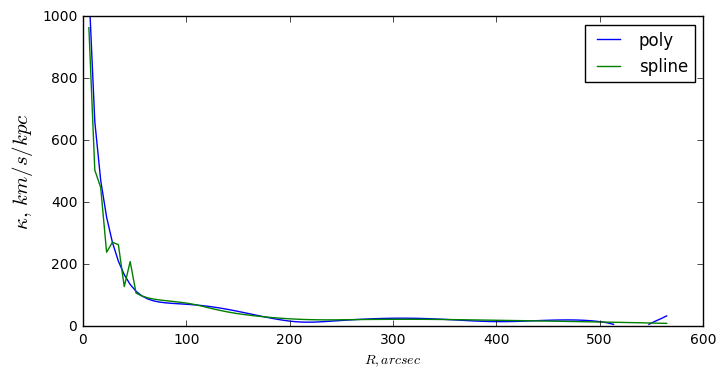

In [37]:
fig = plt.figure(figsize=[8, 4])
plt.plot(test_points, [epicyclicFreq_real(gas_approx, x, scale) for x in test_points], '-', label='poly')
plt.plot(test_points, [epicyclicFreq_real(spl_gas, x, scale) for x in test_points], '-', label='spline')
plt.xlabel('$R, arcsec$')
plt.ylabel('$\kappa,\, km/s/kpc$', fontsize=15)
plt.ylim(0, 1000)
plt.legend()
plt.show()

Достаточно сложно, учитывая что нас интересуют первые 50 секунд.

### Поверхностная плотность газа 

Данные $\Sigma_{HI}$ и $\Sigma_{H_2}$ https://arxiv.org/pdf/1608.06735v1.pdf

(необходимо иметь в виду, что общий профиль исправлен за гелий следующим образом $\Sigma_g = 1.36\times(\Sigma_{H_2} + \Sigma_{HI})$ и переход CO-to-H2 тоже конкретный)

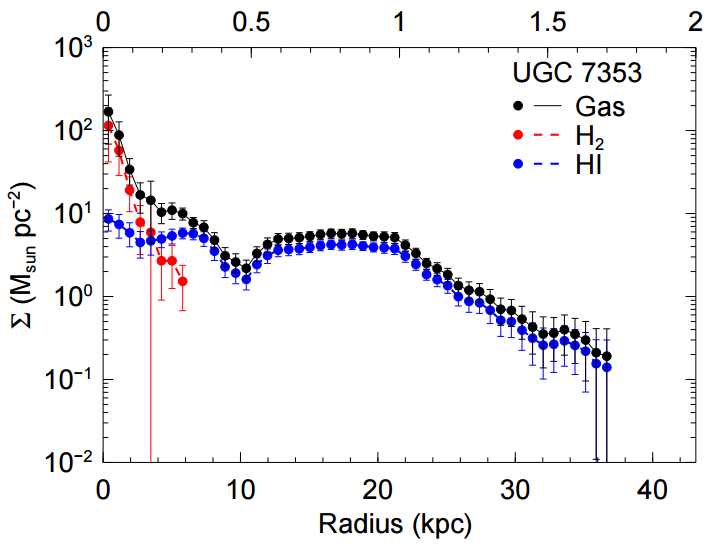

In [38]:
Image('u7353_gas_dens.png')

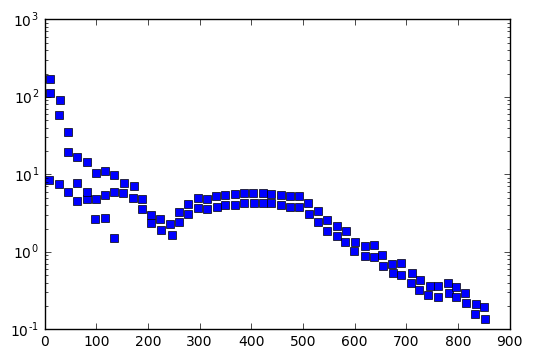

In [39]:
r_g_dens, gas_dens = zip(*np.loadtxt("gas_data.dat", float, delimiter=','))

plt.semilogy([l/scale for l in r_g_dens], gas_dens, 's')
plt.show()

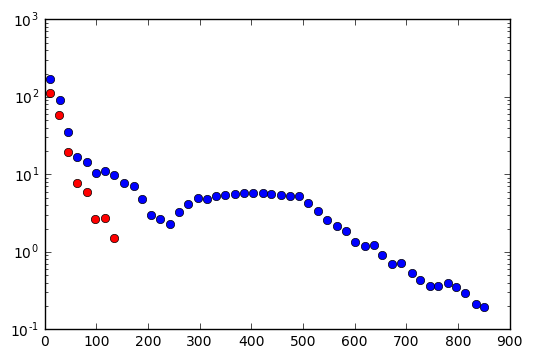

In [40]:
plt.semilogy([l/scale for l in r_g_dens[48:56]], gas_dens[48:56], 'o', color='r')
plt.semilogy([l/scale for l in r_g_dens[56:]], gas_dens[56:], 'o') #только сумма
plt.show()

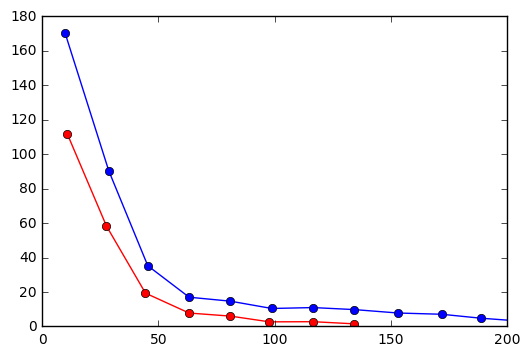

In [41]:
plt.plot([l/scale for l in r_g_dens[48:56]], gas_dens[48:56], '-o', color='r')
plt.plot([l/scale for l in r_g_dens[56:]], gas_dens[56:], '-o') #только сумма
plt.xlim(0, 200)
plt.show()

In [42]:
r_HI_dens, HI_dens = [l/scale for l in r_g_dens[:48]], gas_dens[:48]
r_mol_dens, mol_dens = [l/scale for l in r_g_dens[48:56]], gas_dens[48:56]
r_g_dens, gas_dens = [l/scale for l in r_g_dens[56:]], gas_dens[56:] #используем только полный газ

## Данные по фотометрии

* Вот тут есть профили http://mnras.oxfordjournals.org/content/312/1/2.full.pdf по V, R, I по $H_{\alpha}$, но без декомпозиции (ее же с натяжкой можно использовать?)
* Декомпозиция GALFIT http://iopscience.iop.org/article/10.1088/0004-637X/780/1/69/pdf в K (в этой работе получалось, что есть и бар, и внутр. диск и ядро)
* данные балджа в I http://iopscience.iop.org/article/10.1086/423036/pdf
* B-V http://iopscience.iop.org/article/10.1088/0004-637X/716/2/942/pdf $B-V \approx 0.77$, есть композиция в 3.6 μm
* Фотометрия в I, кривая вращения по газу, декомпозиция в V,I,J http://pasj.oxfordjournals.org/content/60/3/493.full.pdf а также M/L оценки для трех полос! (есть кстати 1068)
* S4G фотометрия (почему-то нет в онлайн-данных в релизе http://adsabs.harvard.edu/abs/2015ApJS..219....4S, хотя в первой таблице есть. Приходится брать на сайте http://www.oulu.fi/astronomy/S4G_PIPELINE4/MAIN/decomp0109.html#entry0002 и исправлять)
* 3.6μm из Fisher http://iopscience.iop.org/article/10.1088/0004-637X/716/2/942/pdf

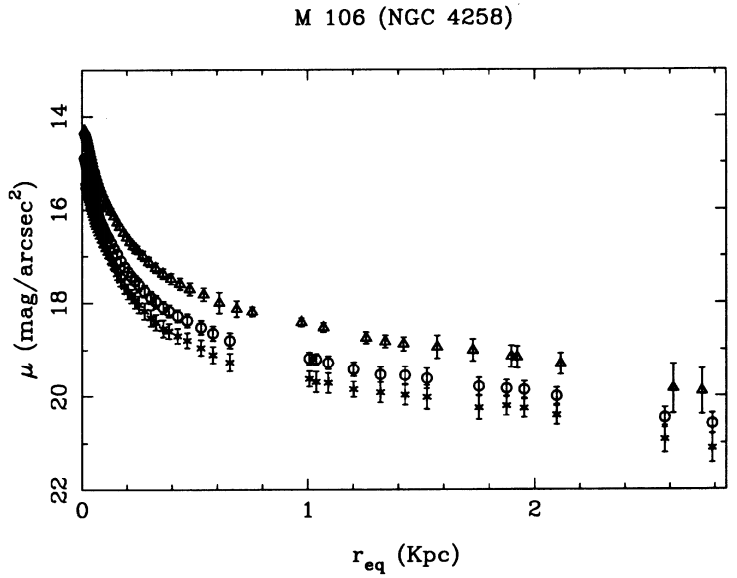

In [43]:
Image('VRI_photom_profiles.png', width=400)

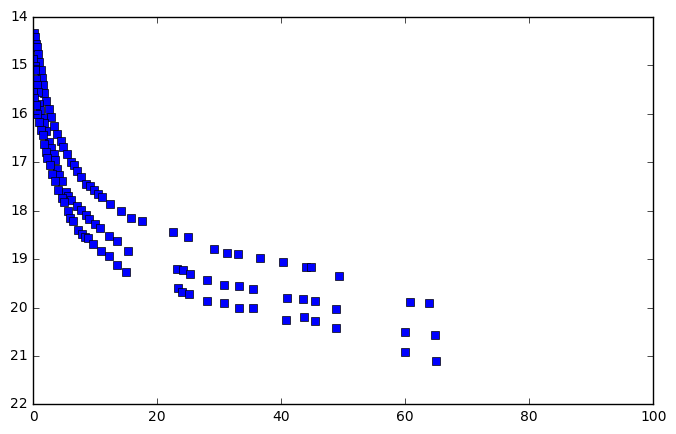

In [44]:
r_phot, mu_phot = zip(*np.loadtxt("VRI_photom_profiles.dat", float, delimiter=','))

fig = plt.figure(figsize=[8, 5])
plt.plot(map(lambda l: l/scale, r_phot), mu_phot, 's') 
plt.ylim(22, 14)
plt.xlim(0, 100.)
plt.show()

In [45]:
r_phot = map(lambda l: l/scale, r_phot) # но не факт, что там такое расстояние - т.к. All distances and linear sizes have been calculated from the radial
# velocities listed in Table 2, assuming H0 = 55 km s21 Mpc21 and q0=0 , скорость у нее 488 км/с (я прикинул - вроде похоже, у нас расст. 8.97 МПк и из Хаббла похоже)

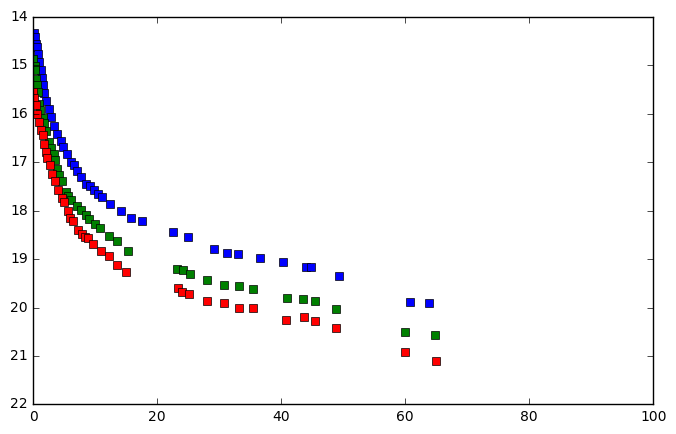

In [46]:
r_photI, mu_photI = r_phot[:43], mu_phot[:43]
r_photR, mu_photR = r_phot[43:86], mu_phot[43:86]
r_photV, mu_photV = r_phot[86:], mu_phot[86:]

fig = plt.figure(figsize=[8, 5])
plt.plot(r_photI, mu_photI, 's')
plt.plot(r_photR, mu_photR, 's')
plt.plot(r_photV, mu_photV, 's')
plt.ylim(22, 14)
plt.xlim(0, 100.)
plt.show()

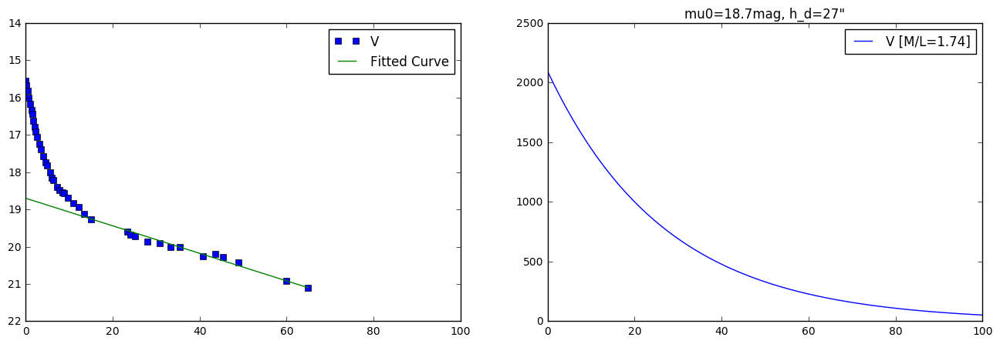

In [47]:
from scipy.optimize import curve_fit

p_ = np.arange(0.1, 100., 0.1)

def func(x, a, b):
    return a * x + b

popt, pcov = curve_fit(func, r_photV[25:], mu_photV[25:])

fig = plt.figure(figsize=[16, 5])
plt.subplot(121)
plt.plot(r_photV, mu_photV, 's', label='V')
plt.plot(r_photV, map(lambda l: func(l, *popt), r_photV), '-', label="Fitted Curve")
plt.ylim(22, 14)
plt.xlim(0, 100.)
plt.legend()

plt.subplot(122)
M_to_L_V = 1.74
plt.plot(p_, [surf_density(mu=m, M_to_L=M_to_L_V, band='V') for m in [mu_disc(l, mu0=popt[1], h=1./popt[0]) for l in p_]], '-', label='V [M/L={:2.2f}]'.format(M_to_L_V))
plt.title('mu0={:2.1f}mag, h_d={:2.0f}"'.format(popt[1], 1./popt[0]))
plt.legend()
plt.show()

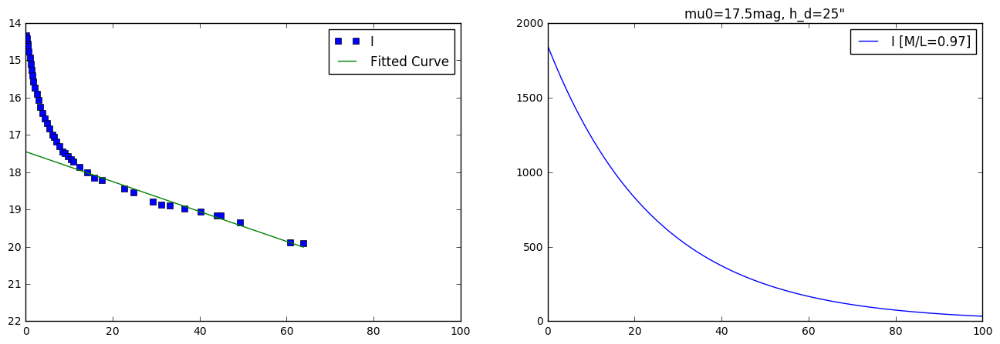

In [48]:
popt, pcov = curve_fit(func, r_photI[25:], mu_photI[25:])

fig = plt.figure(figsize=[16, 5])
plt.subplot(121)
plt.plot(r_photI, mu_photI, 's', label='I')
plt.plot(r_photI, map(lambda l: func(l, *popt), r_photI), '-', label="Fitted Curve")
plt.ylim(22, 14)
plt.xlim(0, 100.)
plt.legend()

plt.subplot(122)
M_to_L_I = 0.97
plt.plot(p_, [surf_density(mu=m, M_to_L=M_to_L_I, band='I') for m in [mu_disc(l, mu0=popt[1], h=1./popt[0]) for l in p_]], '-', label='I [M/L={:2.2f}]'.format(M_to_L_I))
plt.title('mu0={:2.1f}mag, h_d={:2.0f}"'.format(popt[1], 1./popt[0]))
plt.legend()
plt.show()

Много получается и параметры не похожи на след. работу.

In [49]:
all_photometry = []

Из последней статьи, данные в $I$:

In [50]:
# for I band
r_eff_I = 14.89
mu_eff_I = 18.48
n_I = 1.5
mu0d_I = 18.26
h_disc_I = 74.24

Сравнение с предыдущим:

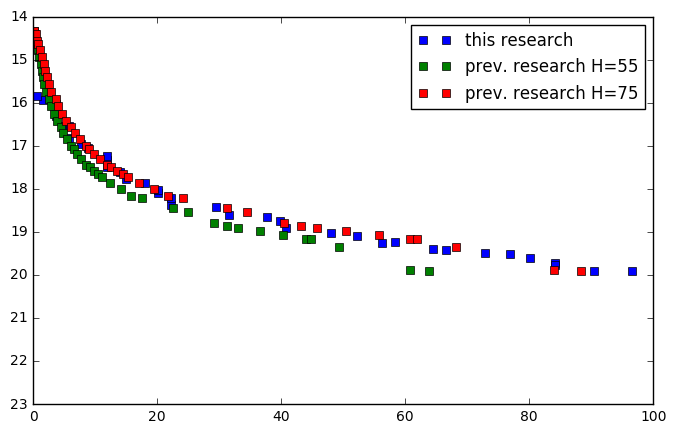

In [51]:
p_ = np.arange(0.1, 300., 0.1)

r_phot, mu_phot = zip(*np.loadtxt("photom_I.dat", float, delimiter=','))

fig = plt.figure(figsize=[8, 5])
plt.plot(map(abs,r_phot), mu_phot, 's', label='this research')
plt.plot(r_photI, mu_photI, 's', label='prev. research H=55')
plt.plot(map(lambda l:l*9./(488./75.), r_photI), mu_photI, 's', label='prev. research H=75')
plt.ylim(23, 14)
plt.xlim(0, 100.)
plt.legend()
plt.show()

Либо выше недооценено и поэтому такие маленькие значения диска, либо все же пересчет в секунды другой (с нормальной константой Хаббла).

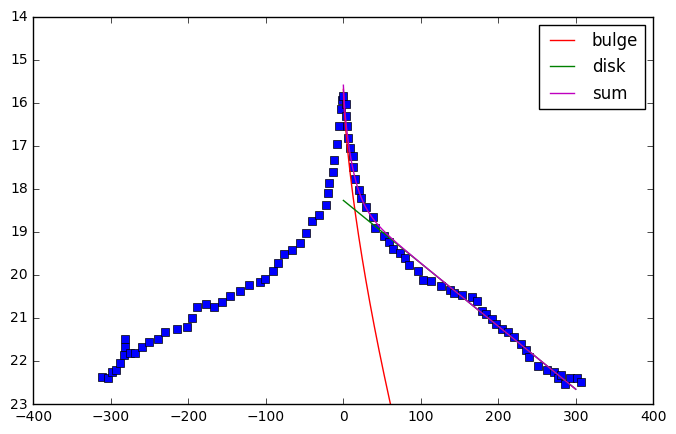

In [52]:
bulge_I = [mu_bulge(l, mu_eff=mu_eff_I, r_eff=r_eff_I, n=n_I) for l in p_]
disc_I = [mu_disc(l, mu0=mu0d_I, h=h_disc_I) for l in p_]
total_profile = total_mu_profile(bulge_I, disc_I)

fig = plt.figure(figsize=[8, 5])
plt.plot(r_phot, mu_phot, 's')
plt.plot(p_, bulge_I, '-', label='bulge', color='red')
plt.plot(p_, disc_I, '-', label='disk', color='green')
plt.plot(p_, total_profile, '-', label='sum', color='m')
plt.ylim(23, 14)
plt.legend()
plt.show()

Похоже. Оценка ${M/L}_I$ для диска у них в работе 0.97, посмотрим:

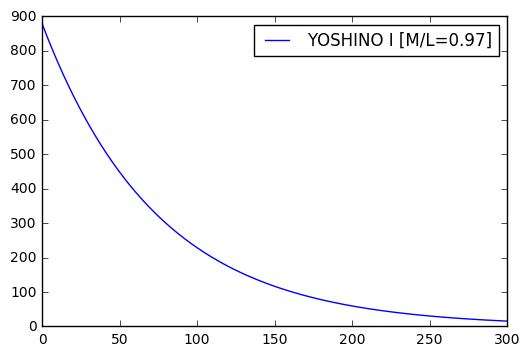

In [53]:
M_to_L_I = 0.97
surf_I = [surf_density(mu=m, M_to_L=M_to_L_I, band='I') for m in disc_I]

plt.plot(p_, surf_I, '-', label='YOSHINO I [M/L={:2.2f}]'.format(M_to_L_I))
plt.legend()

У них нет картинок для $V$ и $J$, но можно посмотреть на них тоже:

In [54]:
# for V band
r_eff_V = 10.34
mu_eff_V = 18.57
n_V = 1.5
mu0d_V = 19.54
h_disc_V = 78.55
M_to_L_V = 1.74
disc_V = [mu_disc(l, mu0=mu0d_V, h=h_disc_V) for l in p_]

In [55]:
# for J band
r_eff_J = 7.31
mu_eff_J = 16.43
n_J = 1.5
mu0d_J = 16.37
h_disc_J = 38.95
M_to_L_J = 0.95
disc_J = [mu_disc(l, mu0=mu0d_J, h=h_disc_J) for l in p_]

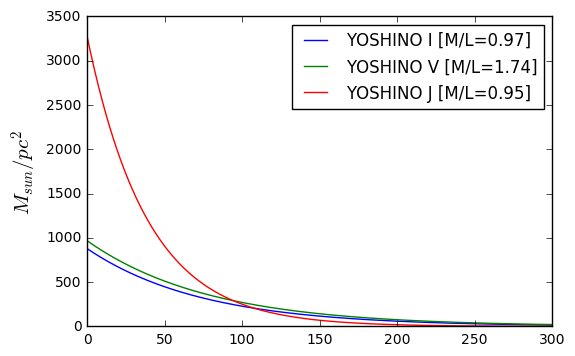

In [56]:
surf_V = [surf_density(mu=m, M_to_L=M_to_L_V, band='V') for m in disc_V]
surf_J = [surf_density(mu=m, M_to_L=M_to_L_J, band='J') for m in disc_J]

plt.plot(p_, surf_I, '-', label='YOSHINO I [M/L={:2.2f}]'.format(M_to_L_I))
plt.plot(p_, surf_V, '-', label='YOSHINO V [M/L={:2.2f}]'.format(M_to_L_V))
plt.plot(p_, surf_J, '-', label='YOSHINO J [M/L={:2.2f}]'.format(M_to_L_J))
plt.ylabel('$M_{sun}/{pc}^2$', fontsize=15.)
plt.legend()

В $J$ похоже что-то не то, возьмем другие две.

Действительно ли это много? Да, похоже таких массивных дисков не бывает.

In [57]:
all_photometry.append(('YOSHINO I', r_eff_I, mu_eff_I, n_I, mu0d_I, h_disc_I, M_to_L_I, 
                       lambda l: surf_density(mu=mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L=M_to_L_I, band='I')))

all_photometry.append(('YOSHINO V', r_eff_V, mu_eff_V, n_V, mu0d_V, h_disc_V, M_to_L_V, 
                       lambda l: surf_density(mu=mu_disc(l, mu0=mu0d_V, h=h_disc_V), M_to_L=M_to_L_V, band='V')))

all_photometry.append(('YOSHINO J', r_eff_J, mu_eff_J, n_J, mu0d_J, h_disc_J, M_to_L_J, 
                       lambda l: surf_density(mu=mu_disc(l, mu0=mu0d_J, h=h_disc_J), M_to_L=M_to_L_J, band='J')))

$3.6\mu m$ из http://iopscience.iop.org/article/10.1088/0004-637X/716/2/942/pdf

In [58]:
# for 3.6 band
dist_36 =  8.17 #Mpc
r_eff_36 = np.power(10., 2.77)/scale/1000./(dist_36/8.97) #pc
mu_eff_36 = 17.41
n_36 = 2.8
mu0d_36 = 18.82
h_disc_36 = np.power(10., 3.5)/scale/1000./(dist_36/8.97) #because original is Log(), pc

Тут нужно учитывать, что эти параметры cкорее всего в AB-mag и нуждаются в доп. исправлении.

In [59]:
M_to_L_s4g = s4g_mass_to_light(-21.328, -20.881)
M_to_L_s4g

0.65393261738835051

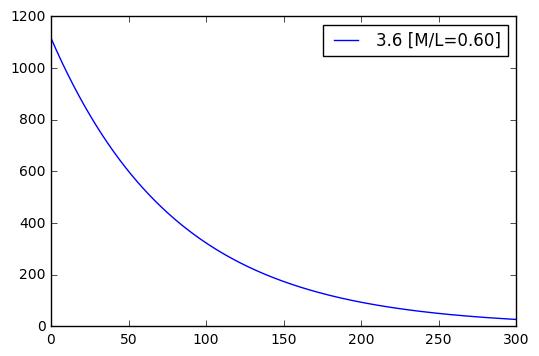

In [60]:
surf_36 = [s4g_surf_density(m, M_to_L=M_to_L_s4g) for m in [mu_disc(l, mu0=mu0d_36, h=h_disc_36) for l in p_]]

plt.plot(p_, surf_36, '-', label='3.6 [M/L={:2.2f}]'.format(0.6))
plt.legend()

Оч.большие. Можем сравнить еще с калибровками McGaugh:

In [61]:
bv_color = 0.77
mcgaugh_mass_to_light(bv_color, 'mu36')

array([ 0.47,  0.58,  0.7 ,  0.62])

Ну да, тут все похоже честно. Правда очень похоже, что нужно приводить диск в положение плашмя, так что добавим исправленную модель тоже:

In [62]:
all_photometry.append(('SPITZER 3.6', r_eff_36, mu_eff_36, n_36, mu0d_36, h_disc_36, M_to_L_s4g, 
                       lambda l: s4g_surf_density(mu_disc(l, mu0=mu0d_36, h=h_disc_36), M_to_L=M_to_L_s4g)))

print mu_face_on(mu0d_36, cos_i)

all_photometry.append(('SPITZER 3.6 faceon', r_eff_36, mu_eff_36, n_36, mu_face_on(mu0d_36, cos_i), h_disc_36, M_to_L_s4g, 
                       lambda l: s4g_surf_density(mu_disc(l, mu0=mu_face_on(mu0d_36, cos_i), h=h_disc_36), M_to_L=M_to_L_s4g)))

19.9002390653


И наконец GALFIT в $K$ из http://iopscience.iop.org/article/10.1088/0004-637X/780/1/69/pdf

Тип тут SAB(s)bc, есть еще дополнительные компоненты - idisk, bar, spir

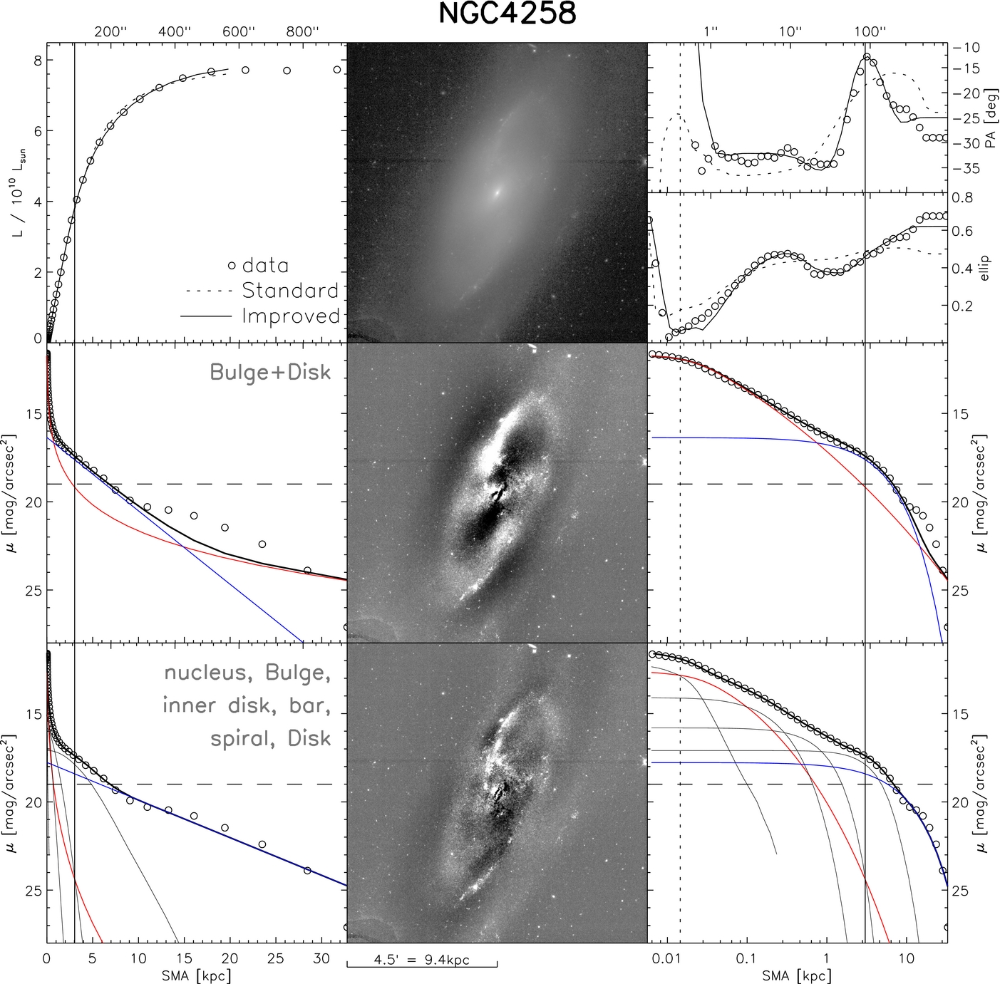

In [63]:
Image('https://s3.amazonaws.com/aasie/images/0004-637X/780/1/69/apj488463f25_hr.jpg', width=400)

In [64]:
# используем вторую модель, т.к. она лучше; 
# также надо пересчитывать из светимости яркость - возьму поверхн яркость с картинки - примерно 17.8
m_b_K = 9.24 
r_eff_K = 6.27
n_K = 3.26 
m_d_K = 6.00
h_disc_K = 146.

In [65]:
M_to_L_K = bell_mass_to_light(bv_color, 'K', 'B-V') #оценку берем из пред. работы
M_to_L_K

0.79058760299863684

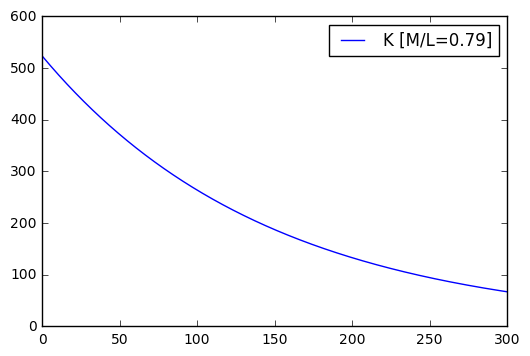

In [66]:
surf_K = [surf_density(mu=m, M_to_L=M_to_L_K, band='K') for m in [mu_disc(l, mu0=17.8, h=h_disc_K) for l in p_]]

plt.plot(p_, surf_K, '-', label='K [M/L={:2.2f}]'.format(M_to_L_K))
plt.legend()

Вполне нормальная оценка.

In [67]:
all_photometry.append(('GALFIT K', r_eff_K, None, n_K, 17.8, h_disc_K, M_to_L_K, 
                       lambda l: surf_density(mu=mu_disc(l, mu0=17.8, h=h_disc_K), M_to_L=M_to_L_K, band='K')))

S4G фоометрия с сайта (надо пересчитать масштаб из пикселей и поверхностую яркость из абс. зв. величины):

In [68]:
h_disc_s4g = 238.3528*0.75
mu0d_s4g =  3.24 - (log10((9.9858 + 5*log10(h_disc_s4g*scale) + 38.57)/4.255) - 8)/0.4
h_disc_s4g, mu0d_s4g

(178.7646, 20.50187578788826)

Масштаб диска конечно какой-то совсем уж не реалистичный.

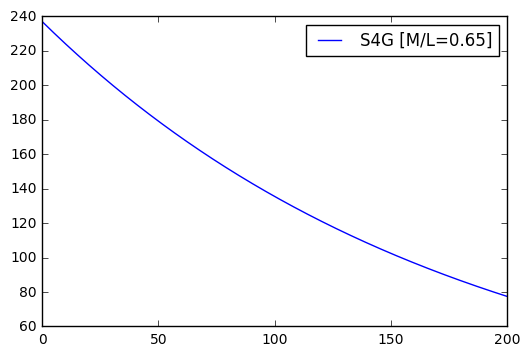

In [69]:
p_ = np.arange(0.1, 200., 0.1)

surf_s4g = [s4g_surf_density(mu_disc(l, mu0=mu0d_s4g, h=h_disc_s4g), M_to_L_s4g) for l in p_]
plt.plot(p_, surf_s4g, '-', label='S4G [M/L={:2.2f}]'.format(M_to_L_s4g))
plt.legend()
plt.show()

In [70]:
all_photometry.append(('S4G 3.6', None, None, None, mu0d_s4g, h_disc_s4g, M_to_L_s4g, 
                       lambda l: s4g_surf_density(mu_disc(l, mu0=mu0d_s4g, h=h_disc_s4g), M_to_L_s4g)))

Общая картинка:

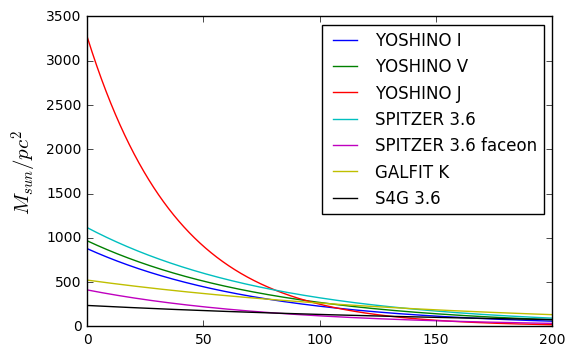

In [71]:
for photom in all_photometry:
    plt.plot(p_, map(photom[-1], p_), '-', label=photom[0].format(M_to_L_I))
plt.ylabel('$M_{sun}/{pc}^2$', fontsize=15.)
plt.legend(loc='best')
plt.legend()

In [72]:
show_all_photometry_table(all_photometry, scale)

+------+--------------------+---------+----------+--------+---------+----------+-------+-------------+-----------+
|      | Name               |   r_eff |   mu_eff |      n |   mu0_d |   h_disc |   M/L | M_d/M_sun   |   Sigma_0 |
|------+--------------------+---------+----------+--------+---------+----------+-------+-------------+-----------|
| 0.00 | YOSHINO I          |   14.89 |    18.48 |   1.50 |   18.26 |    74.24 |  0.97 | 5.62E+10.   |       878 |
| 1.00 | YOSHINO V          |   10.34 |    18.57 |   1.50 |   19.54 |    78.55 |  1.74 | 6.93E+10.   |       967 |
| 2.00 | YOSHINO J          |    7.31 |    16.43 |   1.50 |   16.37 |    38.95 |  0.95 | 5.76E+10.   |      3271 |
| 3.00 | SPITZER 3.6        |   15.03 |    17.41 |   2.80 |   18.82 |    80.74 |  0.65 | 8.45E+10.   |      1116 |
| 4.00 | SPITZER 3.6 faceon |   15.03 |    17.41 |   2.80 |   19.90 |    80.74 |  0.65 | 3.12E+10.   |       413 |
| 5.00 | GALFIT K           |    6.27 |   nan    |   3.26 |   17.80 |   146.00 |

### Сравнение с Кривой вращения тонкого диска

Можно провести тест-сравнение с кривой вращения тонкого диска при заданной фотометрии, если она слишком массивная - то не брать ее (это ограничение сверху).  

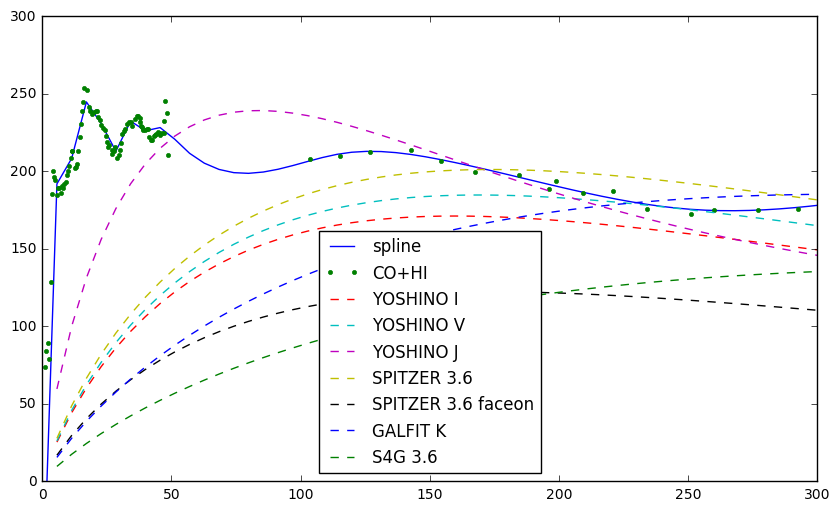

In [73]:
fig = plt.figure(figsize=[10,6])

plt.plot(test_points, spl_gas(test_points), '-', label='spline')

plt.plot(_1, _2, '.', label='CO+HI')

for photom in all_photometry:
    plt.plot(test_points, map(lambda l: disc_vel(l, photom[7](0), photom[5], scale), test_points), '--', label=photom[0])


plt.ylim(0, 300)
plt.xlim(0, 300)
plt.legend(loc='best')
plt.show()

Видно, что $J$ не подходит, да и для $K$ слишком большой диск получился, да и 3.6 массивно слишком.

Кривая вращения в $I$ похожа на картинку из статьи (макс на 150 примерно).

## Зоны звездообразования



$\rm{H_{\alpha}}$, $UV$

* вот тут старые данные по UV и Halpha http://articles.adsabs.harvard.edu/cgi-bin/nph-iarticle_query?1993A%26A...268..419C&amp;data_type=PDF_HIGH&amp;whole_paper=YES&amp;type=PRINTER&amp;filetype=.pdf
* вот тут должна быть картинка из GALEX http://iopscience.iop.org/article/10.1086/523853/pdf но ее нет(

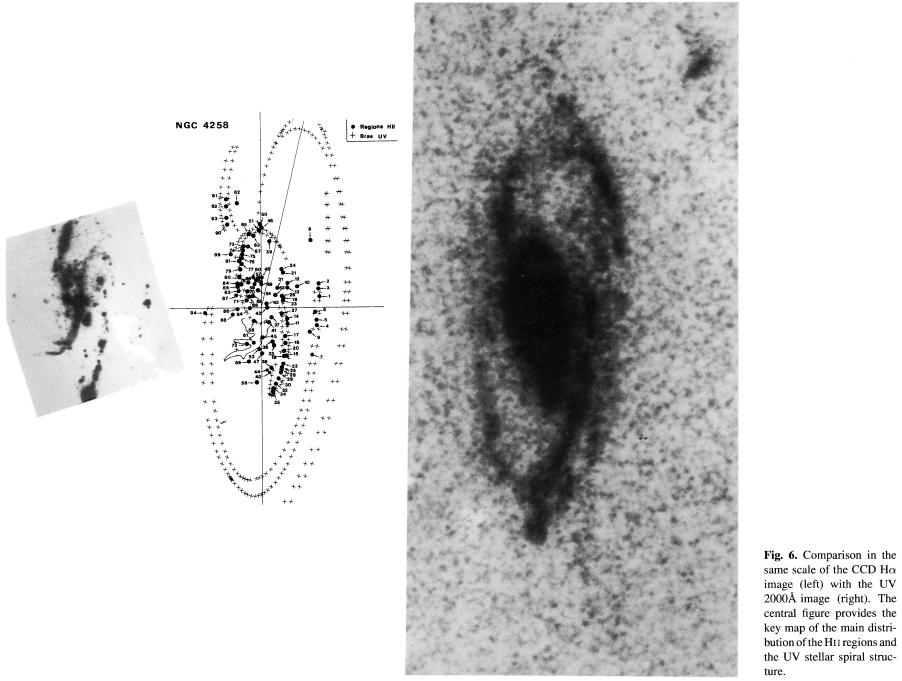

In [74]:
Image('halpha.png', width=1700) #две картинки - Halpha и UV

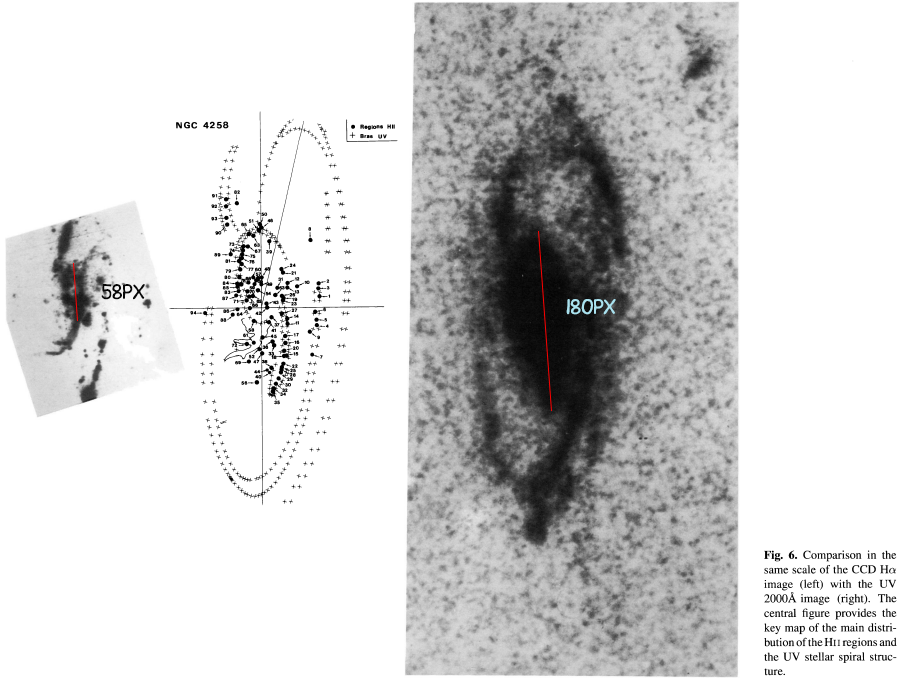

In [75]:
Image('halpha_dist.png', width=600)

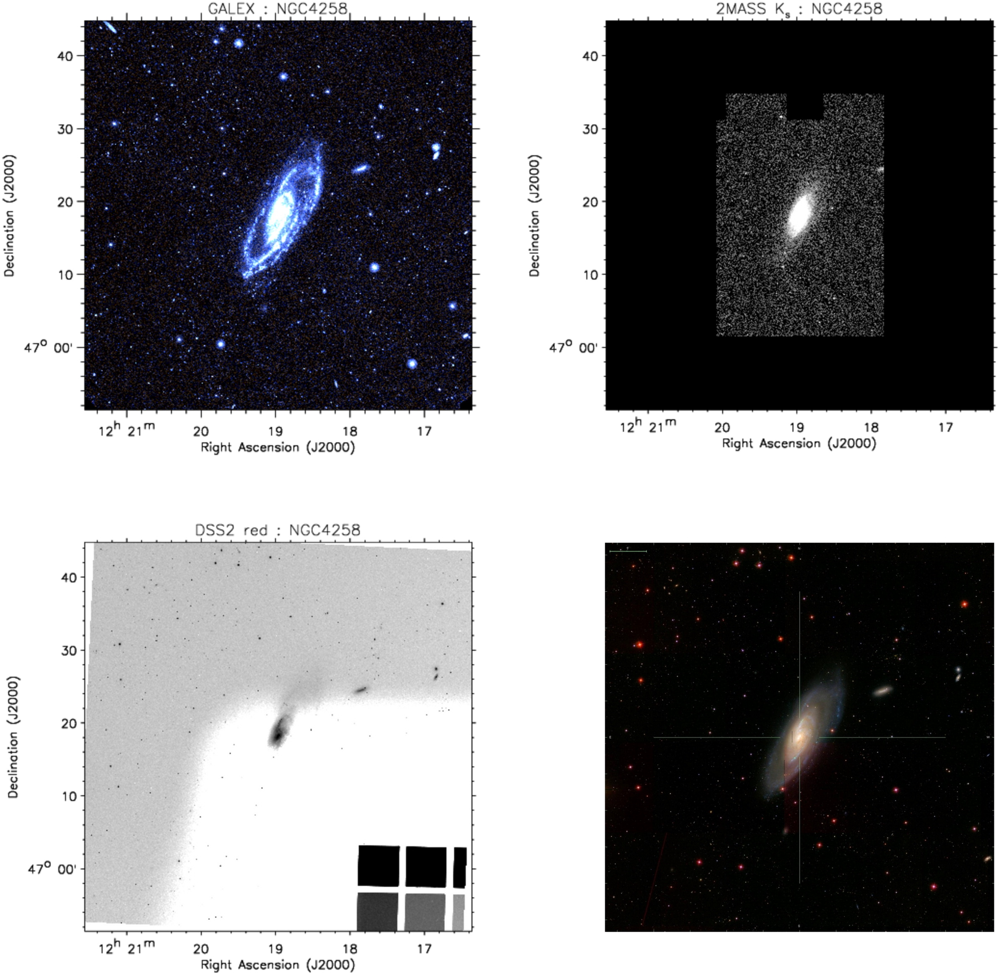

In [76]:
Image('large-fg16_19.jpeg')

Multiwavelength imaging of XUV-disk galaxies. For each object we present (a) GALEX FUVand NUV, (b) 2MASS-Ks, (c) DSS2-red, and (d ) SDSS-DR5
imaging (when available). In the case of SDSS, we display the gri bands as blue, green, and red channels. The extent of all images is 3 times the D25 size of the galaxy.  The print figure only presents two galaxies of each XUV-disk variety, as a guide to content. NGC 772 and NGC 4254 (M99) are shown as examples of Type 1, UGC 10445
and NGC 7418A for mixed-type objects, and NGC 2090 and NGC 2541 for Type 2 XUV-disks. [See the electronic edition of the Supplement for complete set
of Figs. 16.1-16.54.]

Мне кажется, что центральная яркая область довольно большая, порядка 10', но точно не понятно.

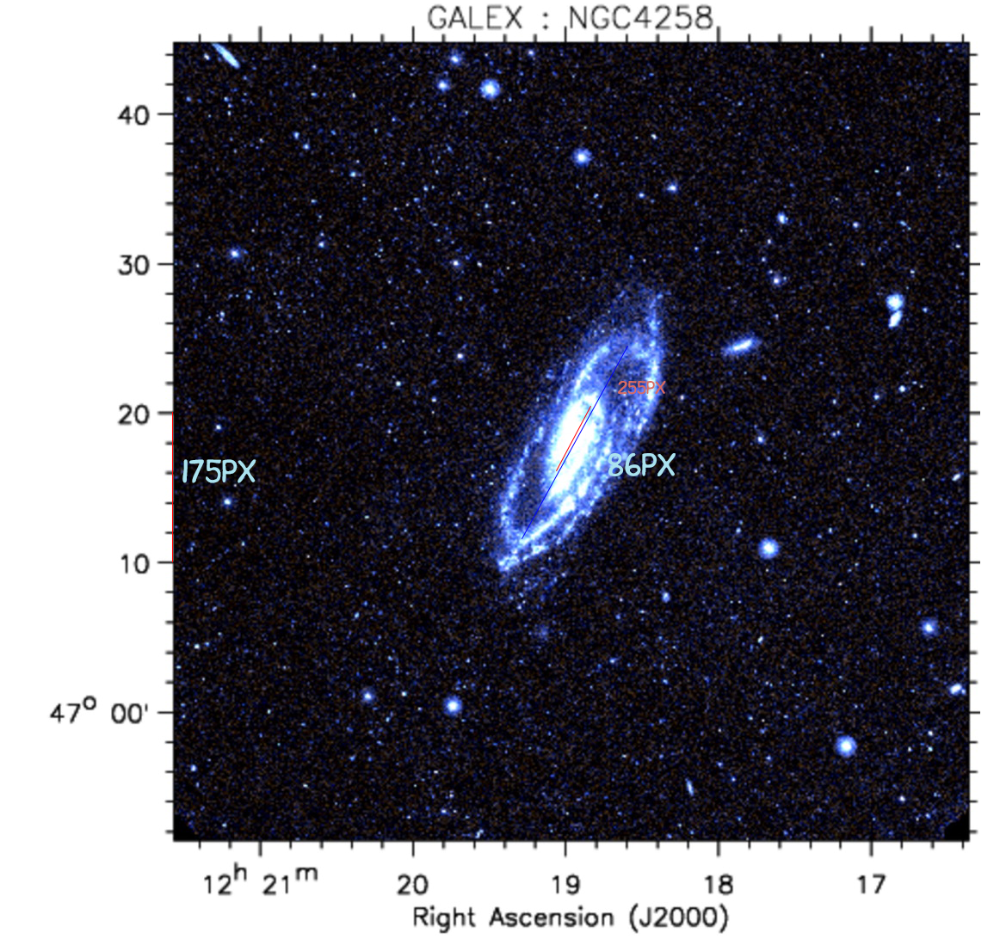

In [77]:
Image('large-fg16_19_dist.png', width=500)

(0, 200)

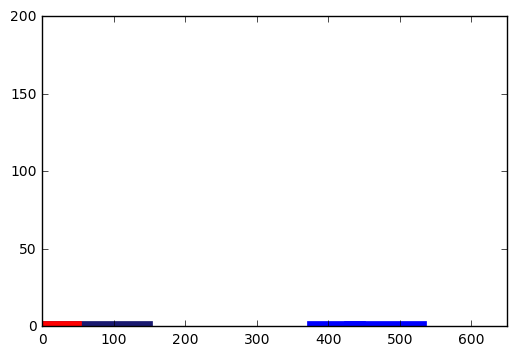

In [78]:
def plot_SF(ax):
    ax.plot([0., 86./2/(175./600.)], [0., 0.], '-', lw=7., color='midnightblue')
#     ax.plot([0., 123./2/(175./600.)], [0., 0.], '-', lw=7., color='midnightblue') # глазами видно, что там больше, но там именно спирали маленькие
    ax.plot([0., 150*58./180.], [0., 0.], '-', lw=7., color='r')
    ax.plot([250./2/(175./600.), 260./2/(175./600.)], [0., 0.], '-', lw=7., color='b') #внешняя спираль
    ax.plot([220./2/(175./600.), 310./2/(175./600.)], [0., 0.], '-', lw=7., color='b') #внешняя спираль, на глаз
    
plot_SF(plt.gca())
plt.xlim(0, 650)
plt.ylim(0, 200)

## Неустойчивость

### Одножидкостная

Устойчиво, когда > 1:
$$Q_g = \frac{\Sigma_g^{cr}}{\Sigma_g}=\frac{\kappa c_g}{\pi G \Sigma_g}$$
$$Q_s = \frac{\Sigma_s^{cr}}{\Sigma_s}=\frac{\sigma_R}{\sigma_R^{min}}=\frac{\kappa \sigma_R}{3.36 G \Sigma_s}$$

In [79]:
sound_vel = 6.  #скорость звука в газе, км/с
data_lim = max(r_sig_ma) #где заканчиваются данные

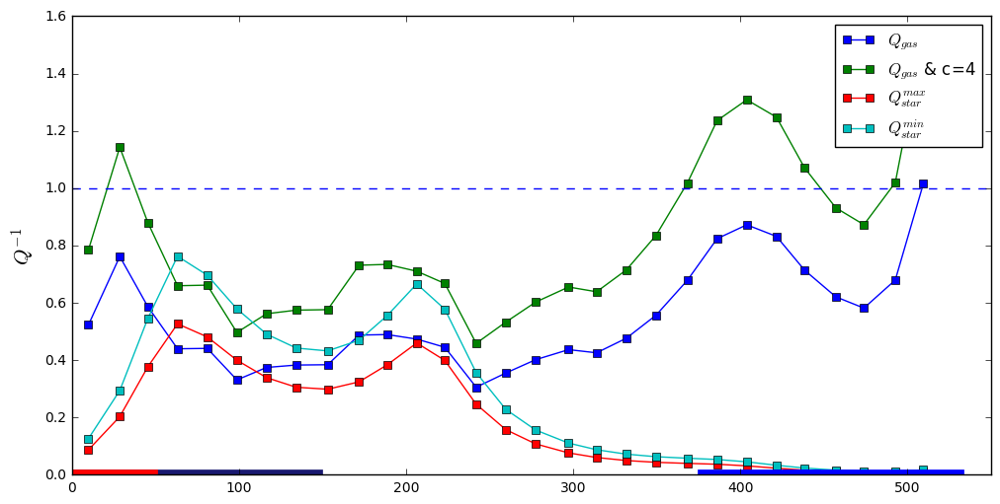

In [80]:
fig = plt.figure(figsize=[12, 6])
gd_data = zip(r_g_dens, gas_dens)
#кроме первой точки, т.к. там деление на ноль
plt.plot(r_g_dens, [1./Qg(epicycl=l[0], sound_vel=sound_vel, gas_density=l[1]) for l in 
                    zip([epicyclicFreq_real(gas_approx, x, scale) for x in r_g_dens], gas_dens)], 's-', label='$Q_{gas}$')
plt.plot(r_g_dens, [1./Qg(epicycl=l[0], sound_vel=4., gas_density=l[1]) for l in 
                    zip([epicyclicFreq_real(gas_approx, x, scale) for x in r_g_dens], gas_dens)], 's-', label='$Q_{gas}$ & c=4')

plt.plot(r_g_dens, [1./Qs(epicycl=l[0], sigma=l[1], star_density=l[2]) for l in 
                    zip([epicyclicFreq_real(gas_approx, x, scale) for x in r_g_dens],
                        map(sig_R_maj_max, r_g_dens), 
                        [surf_density(l_, M_to_L_I, 'I') for l_ in [mu_disc(ll, mu0=mu0d_I, h=h_disc_I) for ll in r_g_dens]])], 's-', label='$Q_{star}^{max}$')

plt.plot(r_g_dens, [1./Qs(epicycl=l[0], sigma=l[1], star_density=l[2]) for l in 
                    zip([epicyclicFreq_real(gas_approx, x, scale) for x in r_g_dens],
                        map(sig_R_maj_min, r_g_dens), 
                        [surf_density(l_, M_to_L_I, 'I') for l_ in [mu_disc(ll, mu0=mu0d_I, h=h_disc_I) for ll in r_g_dens]])], 's-', label='$Q_{star}^{min}$')

plt.axhline(y=1, ls='--')
plt.legend()
plot_SF(plt.gca())
plt.ylabel('$Q^{-1}$', fontsize=15)
plt.xlim(0., 550)
plt.show()

Видно, что в центре с кучей газа неустойчивость, но эффект быстро спадает.

**НЕ ИСПРАВЛЕНО ЗА 1.6!** И правильно, и не надо.

Для внешней спирали что-то видно, давайте сохраним картинку:

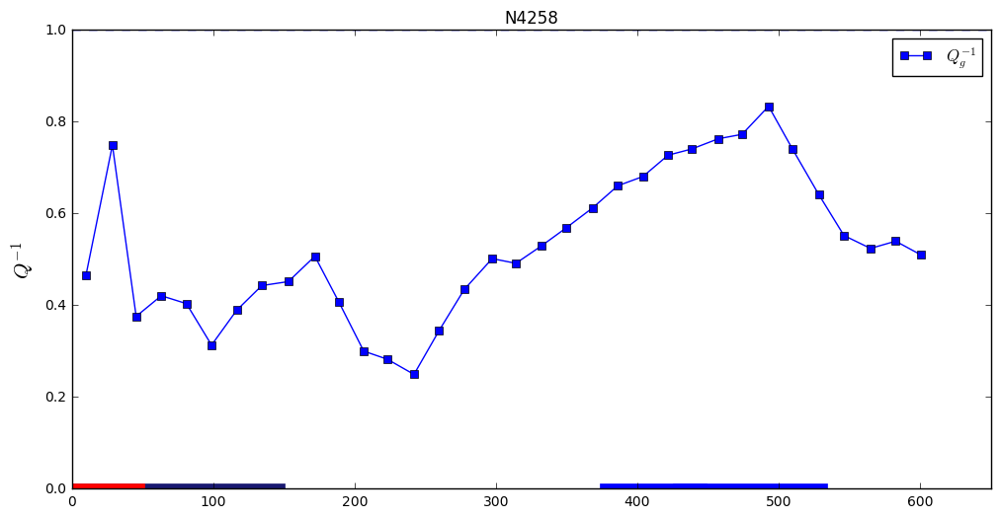

In [81]:
fig = plt.figure(figsize=[12, 6])
gd_data = zip(r_g_dens, gas_dens)

plt.plot(r_g_dens[:-14], [1./Qg(epicycl=l[0], sound_vel=sound_vel, gas_density=l[1]) for l in 
                    zip([epicyclicFreq_real(spl_gas, x, scale) for x in r_g_dens[:-14]], gas_dens[:-14])], 's-', label='$Q_{g}^{-1}$')

plt.axhline(y=1, ls='--')
plt.legend()
plot_SF(plt.gca())
plt.ylabel('$Q^{-1}$', fontsize=15)
plt.title(name)
plt.xlim(0, 650)
plt.savefig('..\\..\pics\\instab_spirals\\'+name+'_spiral'+'.png', format='png', bbox_inches='tight')
plt.show()

### Двухжидкостная

Кинетическое приближение:
$$\frac{1}{Q_{\mathrm{eff}}}=\frac{2}{Q_{\mathrm{s}}}\frac{1}{\bar{k}}\left[1-e^{-\bar{k}^{2}}I_{0}(\bar{k}^{2})\right]+\frac{2}{Q_{\mathrm{g}}}s\frac{\bar{k}}{1+\bar{k}^{2}s^{2}}>1\,$$

Гидродинамическое приближение:
$$\frac{2\,\pi\, G\, k\,\Sigma_{\mathrm{s}}}{\kappa+k^{2}\sigma_{\mathrm{s}}}+\frac{2\,\pi\, G\, k\,\Sigma_{\mathrm{g}}}{\kappa+k^{2}c_{\mathrm{g}}}>1$$ или $$\frac{1}{Q_{\mathrm{eff}}}=\frac{2}{Q_{\mathrm{s}}}\frac{\bar{k}}{1+\bar{k}^{2}}+\frac{2}{Q_{\mathrm{g}}}s\frac{\bar{k}}{1+\bar{k}^{2}s^{2}}>1$$ для безразмерного волнового числа ${\displaystyle \bar{k}\equiv\frac{k\,\sigma_{\mathrm{s}}}{\kappa}},\, s=c/\sigma$

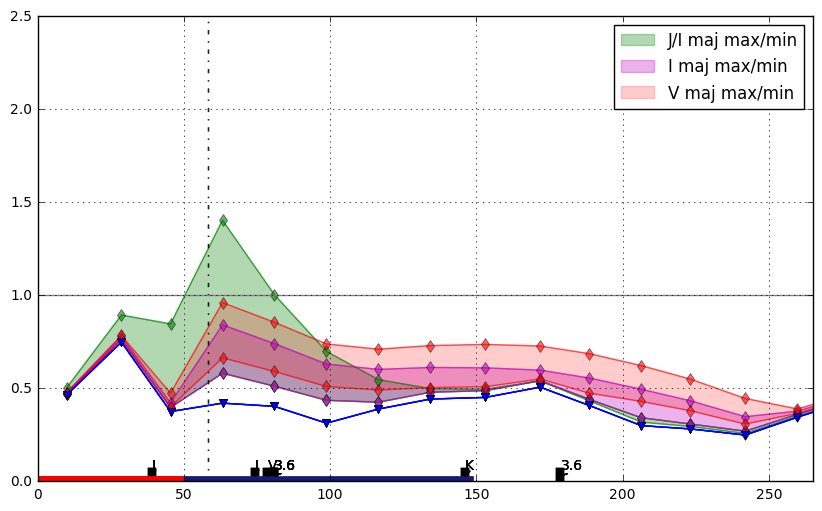

In [82]:
total_gas_data = zip(r_g_dens, map(lambda l: l, gas_dens))[:20]
disk_scales = [(l[5], l[0].split(' ')[1]) for l in all_photometry]


fig = plt.figure(figsize=[10, 6])
ax = plt.gca()

plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data, epicycl=epicyclicFreq_real, 
              gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=sig_R_maj_max, 
              sigma_min=sig_R_maj_min, 
              star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_J, h=h_disc_J), M_to_L_J, 'J'), 
              star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              data_lim=data_lim, color='g', alpha=0.3, disk_scales=disk_scales, label='J/I maj max/min')

plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data, epicycl=epicyclicFreq_real, 
              gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=sig_R_maj_max, 
              sigma_min=sig_R_maj_min, 
              star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              data_lim=data_lim, color='m', alpha=0.3, disk_scales=disk_scales, label='I maj max/min')

plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data, epicycl=epicyclicFreq_real, 
                  gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
                  sigma_max=sig_R_maj_max, 
                  sigma_min=sig_R_maj_min, 
                  star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_V, h=h_disc_V), M_to_L_V, 'V'), 
                  star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_V, h=h_disc_V), M_to_L_V, 'V'), 
                  data_lim=data_lim, color='r', alpha=0.2, disk_scales=disk_scales, label='V maj max/min')

plt.ylim(0., 2.5)
plt.axhline(y=1., ls='-', color='grey')
plot_SF(ax)
plt.grid()
plt.xlim(0., 265.)
plt.show()

Что интересно - держится на субмаржинальном уровне достаточно далеко.

Что насчет третьей точки, почему она оказывается ниже?

In [83]:
gas_data = zip(r_g_dens, gas_dens)[:7]
invQg, invQs, invQeff = zip(*get_invQeff_from_data(gas_data=gas_data, 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=spl_gas,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_min,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), verbose=True))

r = 9.88; gas_d = 170.26; epicycl = 828.67; sig = 119.96; star_d = 768.96
	Qs = 8.91; Qg = 2.15; Qeff = 2.10
r = 28.64; gas_d = 90.39; epicycl = 272.92; sig = 109.81; star_d = 597.24
	Qs = 3.46; Qg = 1.33; Qeff = 1.28
r = 45.43; gas_d = 35.24; epicycl = 212.11; sig = 93.27; star_d = 476.37
	Qs = 2.86; Qg = 2.66; Qeff = 2.36
r = 63.20; gas_d = 16.97; epicycl = 91.21; sig = 81.75; star_d = 374.95
	Qs = 1.37; Qg = 2.38; Qeff = 1.19
r = 80.98; gas_d = 14.67; epicycl = 82.19; sig = 81.75; star_d = 295.11
	Qs = 1.57; Qg = 2.48; Qeff = 1.35
r = 98.75; gas_d = 10.43; epicycl = 75.31; sig = 81.75; star_d = 232.28
	Qs = 1.83; Qg = 3.19; Qeff = 1.58
r = 116.53; gas_d = 10.96; epicycl = 63.68; sig = 81.75; star_d = 182.82
	Qs = 1.96; Qg = 2.57; Qeff = 1.66


Похоже на то, что основная причина - в стремительном падении плотности газа.

## Картинка 

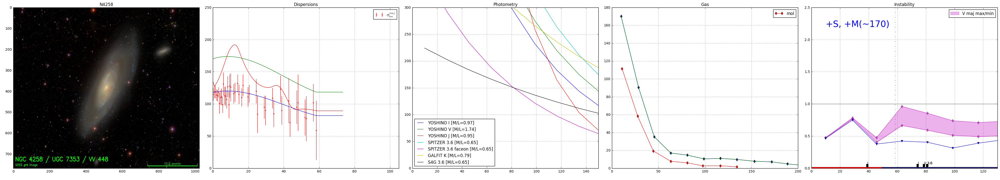

In [84]:
summary_imgs_path = '..\\..\pics\\notebook_summary\\'

def save_model_plot(path):
    fig, axes = plt.subplots(1, 5, figsize=[40,7])
    fig.tight_layout()
    
    axes[0].imshow(ImagePIL.open('n4258_SDSS_labeled.jpg'), aspect='auto')
    axes[0].set_title(name)
    
    try:
        axes[1].errorbar(r_sig_ma, sig_ma, yerr=e_sig_ma, fmt='.', marker='.', mew=0, color='red', label='$\sigma_{los}^{maj}$')
        axes[1].plot(points, map(sig_R_maj_min, points))
        axes[1].plot(points, map(sig_R_maj_max, points))
        axes[1].plot(points, map(sig_R_maj_maxmaxtrue, points))
    except Exception:
        pass
    
    try:
        axes[1].errorbar(r_sig_mi, sig_mi, yerr=e_sig_mi, fmt='.', marker='.', mew=0, color='red', label='$\sigma_{los}^{min}$')
        axes[1].plot(points, map(sig_R_minor_min, points), '--')
        axes[1].plot(points, map(sig_R_minor_max, points), '--')
    except Exception:
        pass

    axes[1].set_ylim(0,250)
    axes[1].set_xlim(0, 105)  
    axes[1].grid()
    axes[1].legend()
    axes[1].set_title('Dispersions')
    
    for photom in all_photometry:
        axes[2].plot(r_g_dens, map(photom[-1], r_g_dens), '-', label='{} [M/L={:2.2f}]'.format(photom[0], photom[-2]))
    axes[2].set_xlim(0, 150)
    axes[2].set_ylim(0, 300)
    axes[2].set_title('Photometry')
    axes[2].grid()
    axes[2].legend(loc='lower left')
    
    axes[3].plot(r_g_dens, gas_dens, 'd-')
    axes[3].plot(zip(*total_gas_data)[0], zip(*total_gas_data)[1], '*-')
    axes[3].plot(r_mol_dens, mol_dens, 'd-', label='mol')
    axes[3].set_title('Gas')
    axes[3].grid()
    axes[3].set_xlim(0, 200)
    axes[3].legend()
    
    #change this
    plot_2f_vs_1f(ax=axes[4], total_gas_data=total_gas_data, epicycl=epicyclicFreq_real, 
                  gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
                  sigma_max=sig_R_maj_max, 
                  sigma_min=sig_R_maj_min, 
                  star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_V, h=h_disc_V), M_to_L_V, 'V'), 
                  star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_V, h=h_disc_V), M_to_L_V, 'V'), 
                  data_lim=data_lim, color='m', alpha=0.3, disk_scales=disk_scales, label='V maj max/min')

    axes[4].set_ylim(0., 2.5)
    axes[4].set_xlim(0., 130.)
    axes[4].axhline(y=1., ls='-', color='grey')
    plot_SF(axes[4])
    axes[4].grid()
    axes[4].set_title('Instability')
    axes[4].text(10., 2.2, '+S, +M(~170)', fontsize=25., color='b')
       
    plt.savefig(path+name+'.png', format='png', bbox_inches='tight')
    plt.show()
    
save_model_plot(summary_imgs_path)

## Учет толщины

## Эксперименты

In [85]:
%%time
gas_data = zip(r_g_dens, gas_dens)[:7]
invQg, invQs, invQeff = zip(*get_invQeff_from_data(gas_data=gas_data, 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=gas_approx,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_maxmax,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))

Wall time: 3.98 s


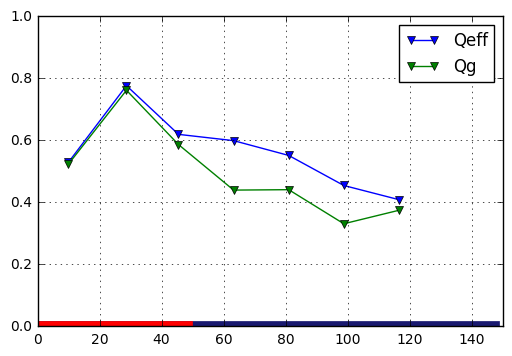

In [86]:
plt.plot(r_g_dens[:7], invQeff, 'v-', label='Qeff')
plt.plot(r_g_dens[:7], invQg, 'v-', label='Qg')
plt.ylim(0., 1.)
plt.xlim(0., 150.)
plot_SF(plt.gca())
plt.legend()
plt.grid()
plt.show()

In [87]:
%%time
gas_data = zip(r_g_dens, gas_dens)[:7]
invQg, invQs, invQeff = zip(*get_invQeff_from_data(gas_data=gas_data, 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=gas_approx,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_maxmaxtrue,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))

Wall time: 3.87 s


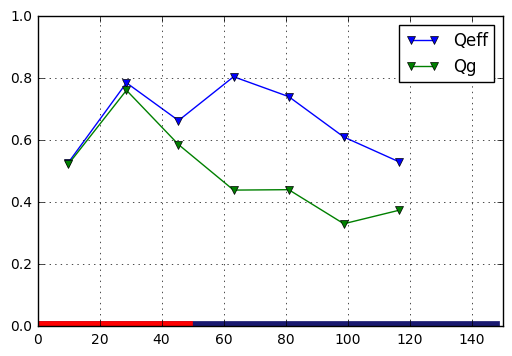

In [88]:
plt.plot(r_g_dens[:7], invQeff, 'v-', label='Qeff')
plt.plot(r_g_dens[:7], invQg, 'v-', label='Qg')
plt.ylim(0., 1.)
plt.xlim(0., 150.)
plot_SF(plt.gca())
plt.legend()
plt.grid()
plt.show()

In [89]:
%%time
gas_data = zip(r_g_dens, gas_dens)[:7]
invQg, invQs, invQeff = zip(*get_invQeff_from_data(gas_data=gas_data, 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=gas_approx,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_minmin,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))

Wall time: 3.86 s


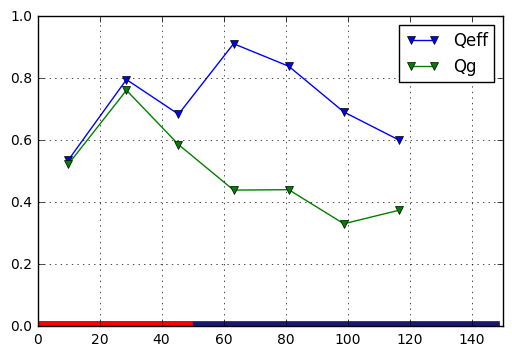

In [90]:
plt.plot(r_g_dens[:7], invQeff, 'v-', label='Qeff')
plt.plot(r_g_dens[:7], invQg, 'v-', label='Qg')
plt.ylim(0., 1.)
plt.xlim(0., 150.)
plot_SF(plt.gca())
plt.legend()
plt.grid()
plt.show()

In [91]:
from plotly import tools
from plotly.offline import init_notebook_mode, iplot
import plotly.plotly as py
import plotly.graph_objs as go
init_notebook_mode(connected=True)

acc_dot = go.Scatter(
    x = r_g_dens[:7], 
    y = invQeff,
    mode='lines+markers',
    name = 'Qeff',
    marker=dict(
        size='16',
        color = ['#770000']*len(invQeff))
)
qgdat = go.Scatter(
    x = r_g_dens[:5], 
    y = invQg,
    mode='lines+markers',
    name = 'Qg',
    marker=dict(
        size='16',
        color = ['#007700']*len(invQeff))
)
data = [acc_dot, qgdat]

iplot(data, filename='scatter-plot-with-colorscale')

C:\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:519: UserWarning:

No labelled objects found. Use label='...' kwarg on individual plots.



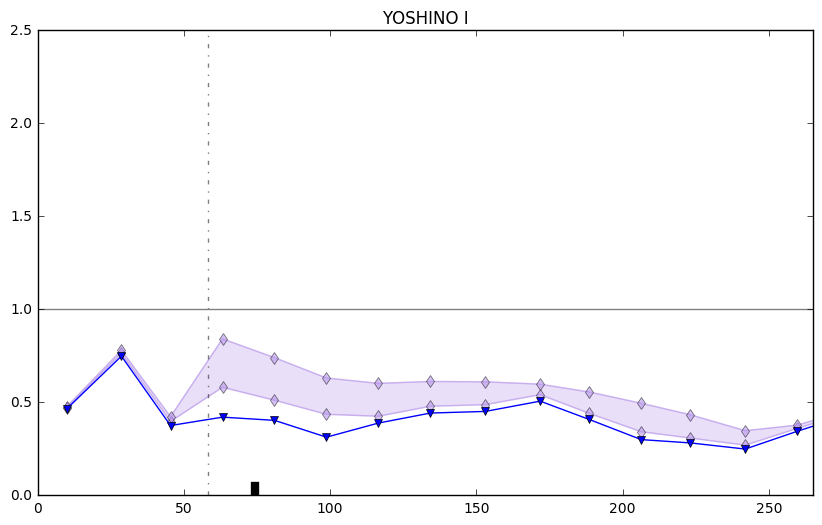

In [92]:
from matplotlib.animation import FuncAnimation

total_gas_data = zip(r_g_dens, map(lambda l: l, gas_dens))[:20]

fig = plt.gcf()
plt.figure(figsize=(10,6))

ax = plt.gca()

def animate(i):
    ax.cla()
    plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data, epicycl=epicyclicFreq_real, gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=sig_R_maj_max, 
              sigma_min=sig_R_maj_min, 
              star_density_max=all_photometry[i][-1], 
              star_density_min=all_photometry[i][-1],
              data_lim=data_lim, color=np.random.rand(3), alpha=0.3, disk_scales=[(all_photometry[i][5], '')])
    ax.axhline(y=1., ls='-', color='grey')
    ax.set_title(all_photometry[i][0])
    ax.set_ylim(0., 2.5)
    ax.set_xlim(0., 265.)
    return ax
anim = FuncAnimation(plt.gcf(), animate, frames=len(all_photometry), interval=1000)

In [93]:
anim.save('..\\..\pics\\'+name+'.gif', writer='imagemagick', fps=1)

In [94]:
from IPython.display import HTML
HTML(anim.to_html5_video())

### Самый максимальный диск

Существует ограничение на максимальный диск в ~0.85 (изотермическое гало) и на субмаксимальный в 0.55-0.6 (NFW гало). Попробуем дотянуть фотметрию до максимальных дисков и посмотрим, как изменятся M/L (скорость зависит как корень из M/L):

YOSHINO I      : M/L was 0.97 and for max it equal 1.00, for submax equal 0.50
YOSHINO V      : M/L was 1.74 and for max it equal 1.49, for submax equal 0.74
YOSHINO J      : M/L was 0.95 and for max it equal 0.48, for submax equal 0.24
SPITZER 3.6    : M/L was 0.65 and for max it equal 0.46, for submax equal 0.23
SPITZER 3.6 faceon: M/L was 0.65 and for max it equal 1.25, for submax equal 0.62
GALFIT K       : M/L was 0.79 and for max it equal 0.56, for submax equal 0.28
S4G 3.6        : M/L was 0.65 and for max it equal 0.99, for submax equal 0.50


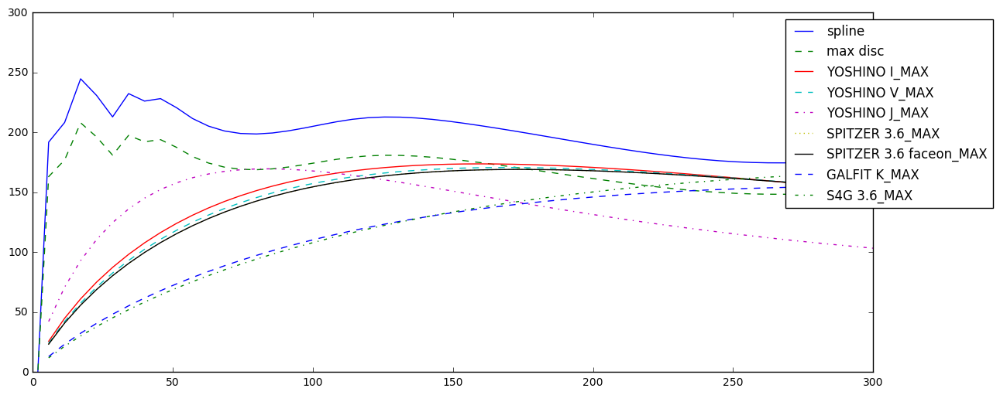

In [95]:
fig = plt.figure(figsize=[14,6])

plt.plot(test_points, spl_gas(test_points), '-', label='spline')
plt.plot(test_points, 0.85*spl_gas(test_points), '--', label='max disc')
# plt.plot(test_points, 0.6*spl_gas(test_points), '--', label='submax disc')
# plt.errorbar(r_wsrt, vel_wsrt, yerr=e_vel_wsrt, fmt='.', marker='.', mew=0, label = 'WSRT')
# plt.plot(r, vel, '.', label = 'Noord thesis')

max_coeffs = {}

for photom in all_photometry:
    disc_max = 2.2*photom[5]
    max_coeff = 0.85*spl_gas(disc_max)/disc_vel(disc_max, photom[7](0), photom[5], scale)
    submax_coeff = 0.6*spl_gas(disc_max)/disc_vel(disc_max, photom[7](0), photom[5], scale)
    
    plt.plot(test_points, map(lambda l: disc_vel(l, max_coeff**2 * photom[7](0), photom[5], scale), test_points), next(linecycler), label=photom[0] + '_MAX')
    
    print '{:15s}: M/L was {:2.2f} and for max it equal {:2.2f}, for submax equal {:2.2f}'.format(photom[0], photom[6], photom[6]*max_coeff**2, photom[6]*submax_coeff**2)
    max_coeffs[photom[0]] = [max_coeff**2, submax_coeff**2]


plt.ylim(0, 300)
plt.xlim(0, 300)
plt.legend(bbox_to_anchor=(1.15, 1.0))
plt.show()

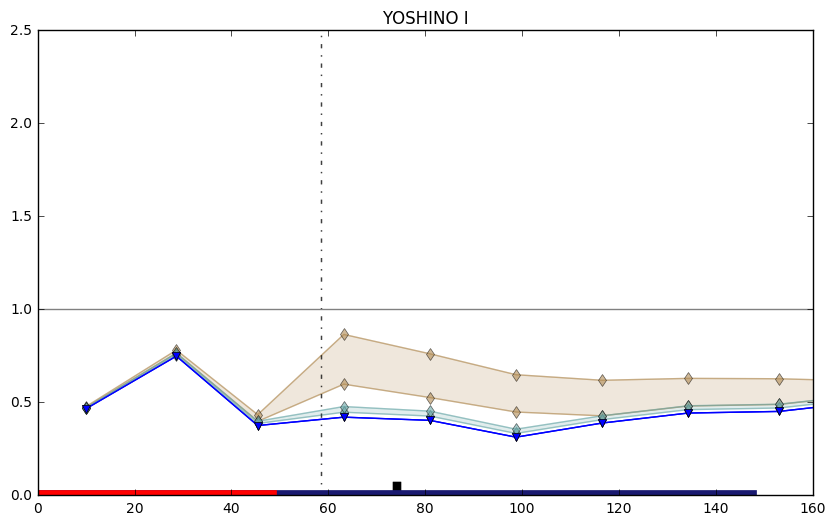

In [96]:
from matplotlib.animation import FuncAnimation

fig = plt.gcf()
plt.figure(figsize=(10,6))

ax = plt.gca()

def animate(i):
    ax.cla()
       
    plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data,
              epicycl=epicyclicFreq_real, gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=sig_R_maj_max, 
              sigma_min=sig_R_maj_min, 
              star_density_max=lambda l: max_coeffs[all_photometry[i][0]][0]*all_photometry[i][-1](l), 
              star_density_min=lambda l: max_coeffs[all_photometry[i][0]][0]*all_photometry[i][-1](l),
              data_lim=data_lim, color=np.random.rand(3), alpha=0.2, disk_scales=[(all_photometry[i][5], '')])
    
    plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data, 
              epicycl=epicyclicFreq_real, gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=sig_R_maj_max, 
              sigma_min=sig_R_maj_min, 
              star_density_max=lambda l: max_coeffs[all_photometry[i][0]][1]*all_photometry[i][-1](l), 
              star_density_min=lambda l: max_coeffs[all_photometry[i][0]][1]*all_photometry[i][-1](l),
              data_lim=data_lim, color=np.random.rand(3), alpha=0.2, disk_scales=[(all_photometry[i][5], '')])
    
    ax.axhline(y=1., ls='-', color='grey')
    ax.set_title(all_photometry[i][0])
    ax.set_ylim(0., 2.5)
    ax.set_xlim(0., 160.)
    plot_SF(ax)
    return ax
anim = FuncAnimation(plt.gcf(), animate, frames=len(all_photometry), interval=1000)

In [97]:
anim.save('..\\..\pics\\'+name+'_MAXDISCS.gif', writer='imagemagick', fps=1)

In [98]:
from IPython.display import HTML
HTML(anim.to_html5_video())

Есть очень неплохие модели.

### Другие механизмы

Schaye (2004), 'cold gas phase':
$$\Sigma_g > 6.1 f_g^{0.3} Z^{-0.3} I^{0.23}$$
или при constant metallicity of 0.1 $Z_{sun}$ and interstellar flux of ionizing photons 10^6 cm−2 s−1:
$$\Sigma_g > 6.1 \frac{\Sigma_g}{\Sigma_g + \Sigma_s}$$

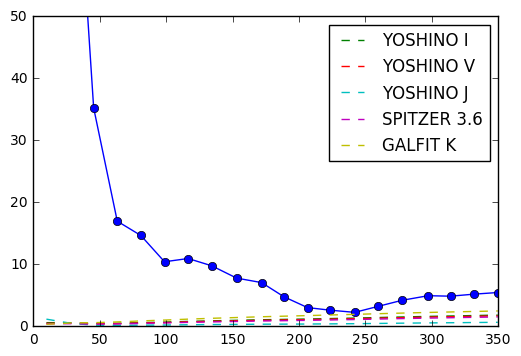

In [96]:
plt.plot(zip(*total_gas_data)[0], zip(*total_gas_data)[1], 'o-')

for photom in all_photometry:
    dens_s04 = [Sigma_crit_S04(l[0], l[1], photom[7]) for l in total_gas_data]
    plt.plot(zip(*total_gas_data)[0], dens_s04, '--', label=photom[0])

plt.legend()
plt.ylim(0, 50.)
plt.show()

Видимо везде неустойчиво.

Hunter et al (1998), 'competition with shear' according to Leroy: 
$$\Sigma_A = \alpha_A\frac{\sigma_g A}{\pi G}$$

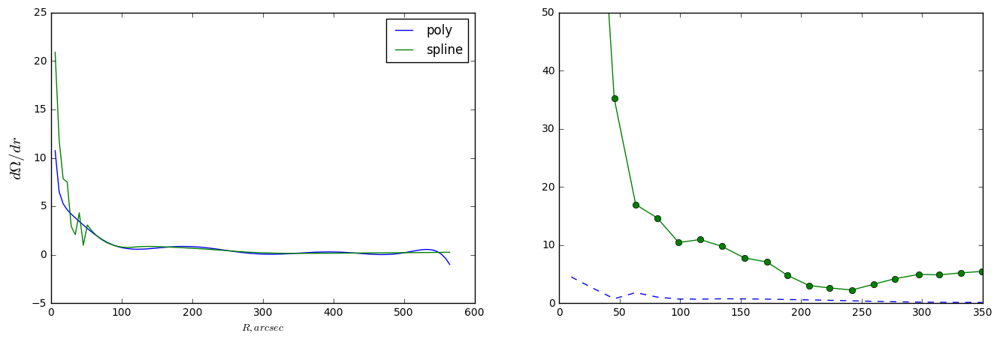

In [97]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=[16, 5])
ax1.plot(test_points, [oort_a(x, gas_approx) for x in test_points], '-', label='poly')
ax1.plot(test_points, [oort_a(x, spl_gas) for x in test_points], '-', label='spline')
ax1.set_xlabel('$R, arcsec$')
ax1.set_ylabel('$d\Omega/dr$', fontsize=15)
ax1.legend()

dens_A = [Sigma_crit_A(l, spl_gas, 2., 6.) for l in zip(*total_gas_data)[0]]
ax2.plot(zip(*total_gas_data)[0], dens_A, '--')
ax2.plot(zip(*total_gas_data)[0], zip(*total_gas_data)[1], 'o-')
ax2.set_ylim(0, 50.)

plt.show()

Непонятно, судя по всему тоже везде неустойчиво.

### Отношение водорода к молекулярному газу

Из https://ui.adsabs.harvard.edu/#abs/2016MNRAS.460.1106W/abstract:
два возможных вида связи между молекулярным и атомарным газом $R_{mol} = \Sigma_{H_2}/\Sigma_{HI}$:

$$R_{mol} = \Sigma_{star}/81$$ или 
$$R_{mol} = \left(\frac{P_h}{1.7 \times 10^4 cm^{-3}K k_B } \right)^{0.8},\, P_h = \frac{\pi}{2}G\Sigma_g(\Sigma_g + \frac{\sigma_g}{\sigma_z}\Sigma_{star})$$

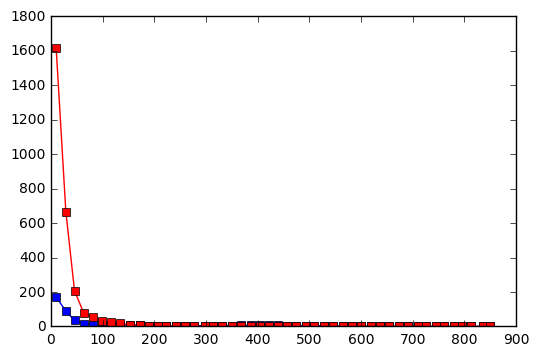

In [98]:
def R1(Sigma_star):
    return Sigma_star/81.

def h2_gas(r, h_gas_dens):
    return R1(star_density(r))*h_gas_dens

star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')

plt.plot(r_g_dens, gas_dens, 's-', color='b')
plt.plot(r_g_dens, [h2_gas(_[0], _[1]) for _ in  zip(r_g_dens, gas_dens)], 's-', color='r')
plt.show()

Вторая оценка - малой оси у нас нет и придется вытаскивать из большой:

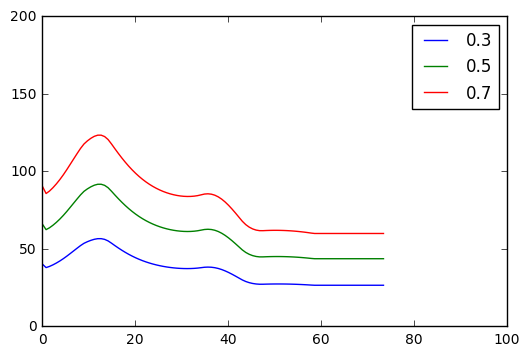

In [99]:
@flat_end(sig_maj_lim)
def sig_R_maj_true(r, alpha, spl_maj=spl_maj):
    return spl_maj(r)/sqrt(sigPhi_to_sigR_real(r)*sin_i**2 + alpha**2 * cos_i**2)

@flat_end(sig_maj_lim)
def sig_z(r, alpha, spl_maj=spl_maj):
    return sig_R_maj_true(r, alpha, spl_maj=spl_maj)*alpha

plt.plot(points, map(lambda l: sig_z(l, 0.3), points), label = '0.3')
plt.plot(points, map(lambda l: sig_z(l, 0.5), points), label = '0.5')
plt.plot(points, map(lambda l: sig_z(l, 0.7), points), label = '0.7')

plt.legend()
plt.ylim(0,200)
plt.xlim(0,100)
plt.show()

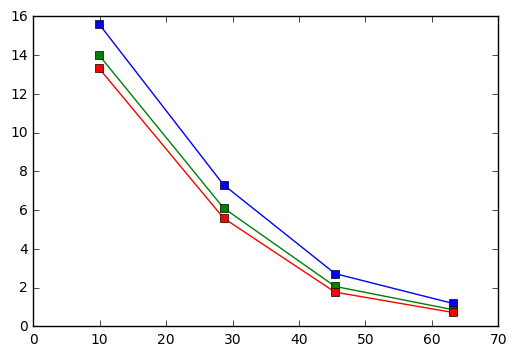

In [100]:
def R2(r, h_gas_dens, alpha, sound_vel):
    G = 6.67408
    kB = 3.7529917
    Ph = np.pi/2. * G * h_gas_dens * (h_gas_dens + sound_vel/sig_z(r, alpha) * star_density(r))
    return np.power(4.363474*Ph/(1.7 * 10000. * kB) , 0.8)

def h2_gas2(r, h_gas_dens, alpha, sound_vel):
    return R2(r, h_gas_dens, alpha, sound_vel)*h_gas_dens

plt.plot(r_g_dens[:4], [R2(_[0], _[1], 0.3, 6.) for _ in  zip(r_g_dens, gas_dens)[:4]], 's-')
plt.plot(r_g_dens[:4], [R2(_[0], _[1], 0.5, 6.) for _ in  zip(r_g_dens, gas_dens)[:4]], 's-')
plt.plot(r_g_dens[:4], [R2(_[0], _[1], 0.7, 6.) for _ in  zip(r_g_dens, gas_dens)[:4]], 's-')
plt.show()

И теперь сравнение с настоящим значением:

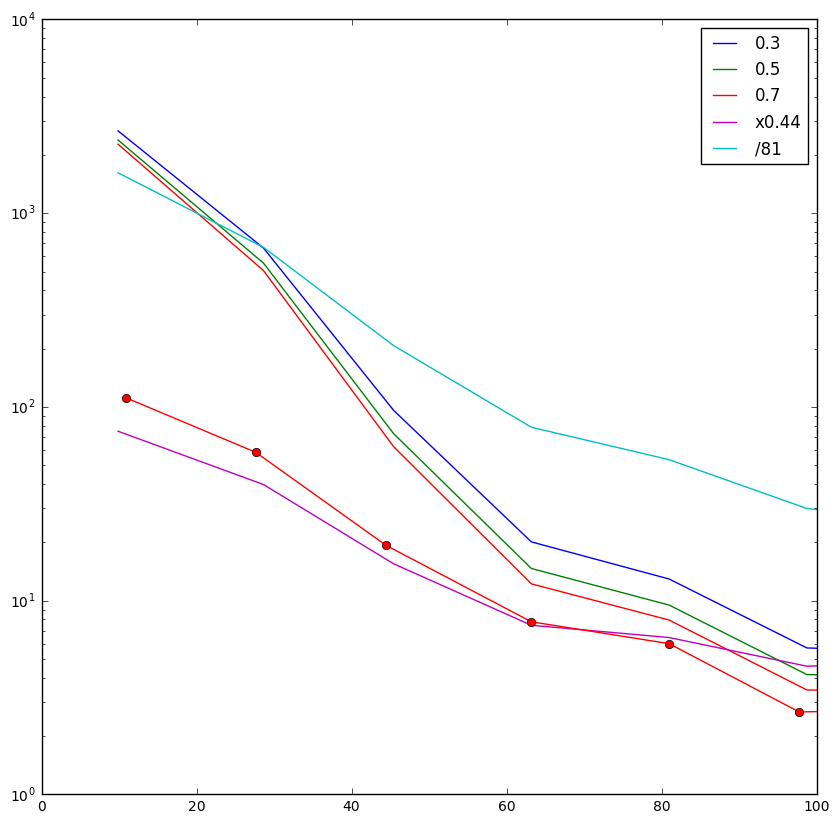

In [101]:
fig = plt.figure(figsize=[10, 10])

# plt.plot(r_g_dens, gas_dens, 's-', color='b')
plt.semilogy(r_g_dens, [h2_gas2(_[0], _[1], 0.3, 6.) for _ in  zip(r_g_dens, gas_dens)], '-', label='0.3')
plt.semilogy(r_g_dens, [h2_gas2(_[0], _[1], 0.5, 6.) for _ in  zip(r_g_dens, gas_dens)], '-', label='0.5')
plt.semilogy(r_g_dens, [h2_gas2(_[0], _[1], 0.7, 6.) for _ in  zip(r_g_dens, gas_dens)], '-', label='0.7')

plt.semilogy(r_g_dens, map(lambda l: 0.44*l, gas_dens), '-', color='m', label='x0.44')
plt.semilogy(r_mol_dens, mol_dens, 'o-', color='r')

plt.semilogy(r_g_dens, [h2_gas(_[0], _[1]) for _ in  zip(r_g_dens, gas_dens)], '-', label='/81')

plt.legend()
plt.ylim(1., 10000.)
plt.xlim(0, 100)
plt.show()

Видно, что He_coeff лучше всего описывает наблюдения.

(надо учесть, что здесь может быть ошибка и относиться с острожностью, например неверно взяты значения атомарного газа - может быть там не убран гелий и т.д.)

### Дисперсии из АD

Интересный вариант для тех галактик, в которых есть данные по газу. Разница между скоростями вращения звезд и газа вокруг центра галактики называется ассиметричным сдвигом и описывается следующим уравнением (Binney & Tremaine 1987): $$v_{\mathrm{c}}^{2}-\bar{v}_{\varphi}^{2}=\sigma_{R}^{2}\left(\frac{\sigma_{\varphi}^{2}}{\sigma_{R}^{2}}-1-\frac{\partial\ln\Sigma_{\mathrm{s}}}{\partial\ln R}-\frac{\partial\ln\sigma_{R}^{2}}{\partial\ln R}\right)\,$$
Отношение ${\displaystyle \frac{\sigma_{\varphi}^{2}}{\sigma_{R}^{2}}}$ знаем из соответствующего уравнения. Поймем, как в этом выражении вычисляется логарифмическая производная ${\displaystyle \frac{\partial\ln\Sigma_{\mathrm{s}}}{\partial\ln R}}$. Если отношение массы к светимости принять постоянной вдоль радиуса величиной, то в производной ${\displaystyle \frac{\partial\ln\Sigma_{\mathrm{s}}}{\partial\ln R}}$ можно использовать поверхностную яркость звездного диска вместо поверхностной плотности $\Sigma_{\mathrm{s}}$ в тех полосах, которые трассируют старое звездное население. Это означает, что логарифмическая производная должна быть заменена отношением $-{\displaystyle \frac{R}{h_{\text{d}}}}\,,$ где $h_{\text{d}}$ --- экспоненциальный масштаб диска.
Вычисление $\frac{\partial\ln\sigma_{R}^{2}}{\partial\ln R}$ из кинематического масштаба равно $-\frac{2R}{h_{kin}}$

In [102]:
def sigR2Evaluation(R, h, h_kin, p_star, p_gas):
    '''Вычисление sigmaR^2 в случае, если уже известен кинетический масштаб.'''
    return (p_gas(R) ** 2 - p_star(R) ** 2 ) / ( sigPhi_to_sigR_real(R) - 1 + R / h + R / h_kin )

def asymmetricDriftEvaluation(r_pc, h, path, p_star, p_gas, upperLimit):
    '''Вычисление ассиметричного сдвига на основе формулы (21) из методички. Логарифмическая производная от радиальной
     дисперсии скоростей считается как предложено в статье Silchenko et al. 2011, экспонентой фитируется для R > 1h.
     Сами значения считаются только для тех точек, есть данные и по газу и по звездам.'''
    eps = 0.1
    h_kin = 0
    h_kin_next = h
    sigR2 = []
    upper = upperLimit
    r_gt_1h = filter(lambda x: x > h and x <= upper, r_pc)
    expfit = poly1d(1)

    h_disc = h

    print '#!!!!!!!!!!!!# Asymmetric drift evaluation procedure with eps = ' + str(eps) + ' starts.'
    while(abs(h_kin - h_kin_next) > eps):
        h_kin = h_kin_next
        sigR2[:] = []
        for R in r_gt_1h:
            sigR2.append((p_gas(R) ** 2 - p_star(R) ** 2 ) / ( sigPhi_to_sigR_real(R) - 1 + R / h + R / h_kin ))
        sigR2 = map(math.log, sigR2)
        expfit = poly1d(polyfit(r_gt_1h, sigR2, deg=1))
        h_kin_next = (-1 / expfit.coeffs[0])
        print '#!!!!!!!!!!!!# Next approx h_kin =', h_kin_next

    h_kin = h_kin_next
    sigR2[:] = []
    for R in r_pc:
        sigR2.append((p_gas(R) ** 2 - p_star(R) ** 2 ) / ( sigPhi_to_sigR_real(R) - 1 + R / h + R / h_kin ))

    sigR20 = math.exp(expfit.coeffs[1])
#     rexp_sigR2 = evalStartExp(r_pc, sigR2, lambda x: sigR20 * math.exp(-x / h_kin))
    return sigR20, h_kin, [sigR2Evaluation(R, h, h_kin, p_star, p_gas) for R in r_pc]

sigR20, h_kin, sigR2 = asymmetricDriftEvaluation(r_sig_ma, 40., '', star_approx, spl_gas, sig_maj_lim)

#!!!!!!!!!!!!# Asymmetric drift evaluation procedure with eps = 0.1 starts.
#!!!!!!!!!!!!# Next approx h_kin = 24.90140622
#!!!!!!!!!!!!# Next approx h_kin = 24.5641332611
#!!!!!!!!!!!!# Next approx h_kin = 24.5549475066


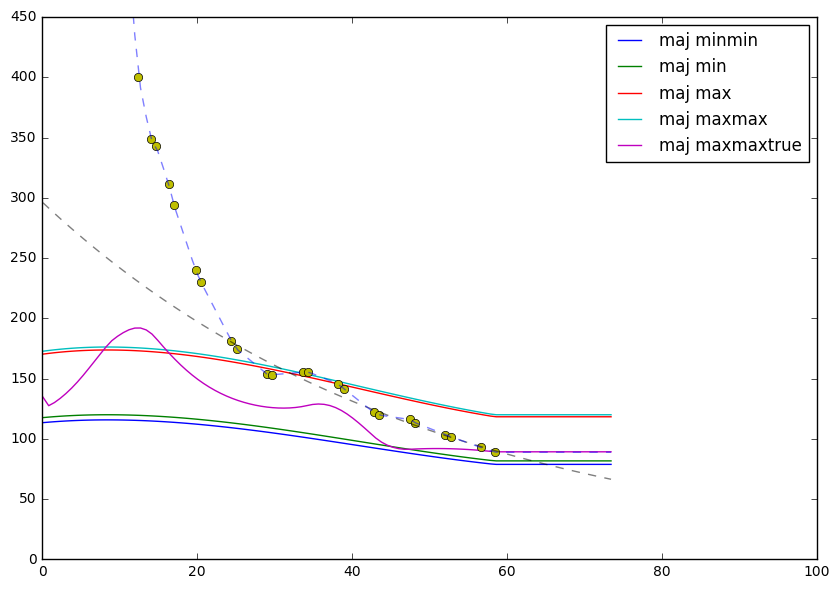

In [103]:
import scipy.interpolate
fig = plt.figure(figsize=[10, 7])

plt.plot(points, map(sig_R_maj_minmin, points), label = 'maj minmin')
plt.plot(points, map(sig_R_maj_min, points), label = 'maj min')
plt.plot(points, map(sig_R_maj_max, points), label = 'maj max')
plt.plot(points, map(sig_R_maj_maxmax, points), label = 'maj maxmax')
plt.plot(points, map(sig_R_maj_maxmaxtrue, points), label = 'maj maxmaxtrue')

plt.plot(r_sig_ma, np.sqrt(sigR2), 'o')
plt.plot(points, map(lambda l: np.sqrt(sigR20 * math.exp(-l / h_kin)), points),  '--', alpha=0.5)

y_interp = scipy.interpolate.interp1d(r_sig_ma, np.sqrt(sigR2))

@flat_end(sig_maj_lim)
def y_interp_(r):
    return y_interp(r)

plt.plot(points[2:], map(y_interp_, points[2:]),  '--', alpha=0.5)

plt.legend()
plt.ylim(0,450)
plt.xlim(0,100)
plt.show()

Довольно неплохо кстати.

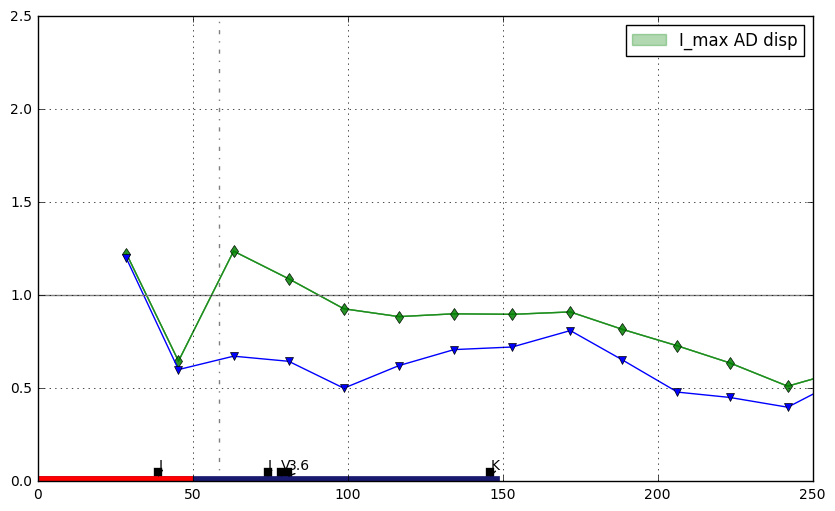

In [104]:
fig = plt.figure(figsize=[10, 6])
ax = plt.gca()

plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data[1:], epicycl=epicyclicFreq_real, 
              gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=y_interp_, 
              sigma_min=y_interp_, 
              star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              data_lim=data_lim, color='g', alpha=0.3, disk_scales=disk_scales, label='I_max AD disp')

plt.ylim(0., 2.5)
plt.axhline(y=1., ls='-', color='grey')
plot_SF(ax)
plt.grid()
plt.xlim(0., 250)
plt.show()

Если брать экспонентой:

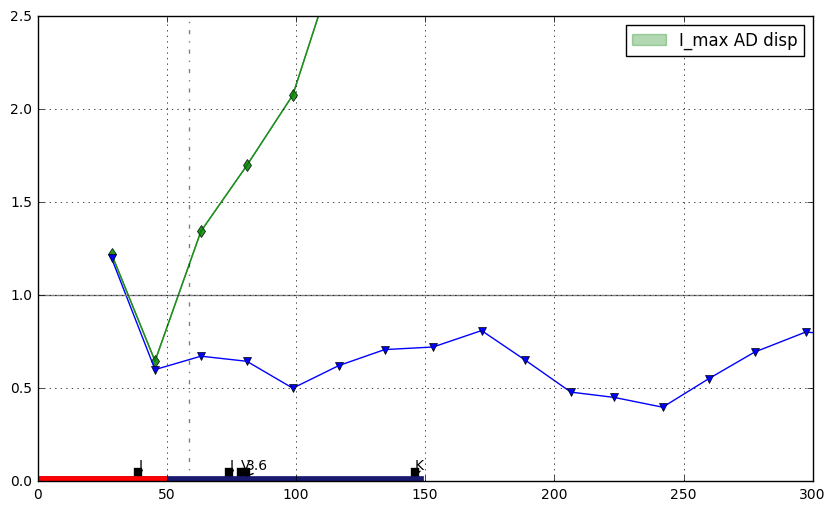

In [105]:
fig = plt.figure(figsize=[10, 6])
ax = plt.gca()

plot_2f_vs_1f(ax=ax, total_gas_data=total_gas_data[1:], epicycl=epicyclicFreq_real, 
              gas_approx=spl_gas, sound_vel=sound_vel, scale=scale, 
              sigma_max=lambda l: np.sqrt(sigR20 * math.exp(-l / h_kin)), 
              sigma_min=lambda l: np.sqrt(sigR20 * math.exp(-l / h_kin)), 
              star_density_max=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              star_density_min=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), 
              data_lim=data_lim, color='g', alpha=0.3, disk_scales=disk_scales, label='I_max AD disp')

plt.xlim(0., 300.)
plt.ylim(0., 2.5)
plt.axhline(y=1., ls='-', color='grey')
plot_SF(ax)
plt.grid()
plt.show()

Но все равно наклон слишком велик.

### Экспоненциальные оценки H2

В работах van der Hulst (2016) и Bigiel, Blitz (2012) есть экспоненциальные соотношения для H2+HI (см. заметки). 

Можно попробовать использовать это для оценки молекулярной компоненты газа:

In [106]:
# r25 = h_disc_B*(25. - mu0d_B)/1.0857
# r25, h_disc_B, (25. - mu0d_B)/1.0857

r25 = 2.8*40.
r25

112.0

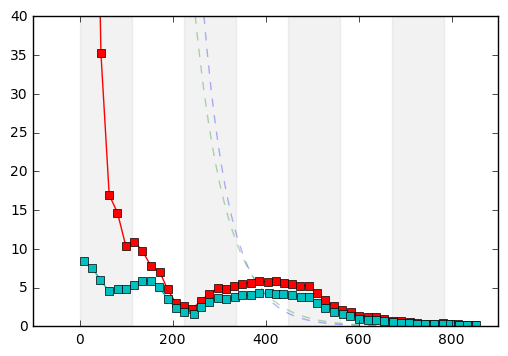

In [107]:
from scipy.optimize import curve_fit

def func1(x, a):
    return a * np.exp(-1.95 * x/r25)

def func2(x, a):
    return a * np.exp(-1.65 * x/r25)

popt, pcov = curve_fit(func1, r_HI_dens[20:], HI_dens[20:])
points_ = np.linspace(100., max(r_g_dens), 100.)
plt.plot(points_, func1(points_, *popt), '--', alpha=0.3)

popt, pcov = curve_fit(func2, r_HI_dens[20:], HI_dens[20:])
points_ = np.linspace(100., max(r_g_dens), 100.)
plt.plot(points_, func2(points_, *popt), '--', alpha=0.3)

for i in range(int(max(r_g_dens)/r25)+1):
    if i%2 == 0:
        plt.axvspan(i*r25, (i+1)*r25, color='grey', alpha=0.1)

plt.plot(r_g_dens, gas_dens, 's-')
plt.plot(r_HI_dens, HI_dens, 's-')
plt.ylim(0., 40.)
plt.show()

0.274483210019


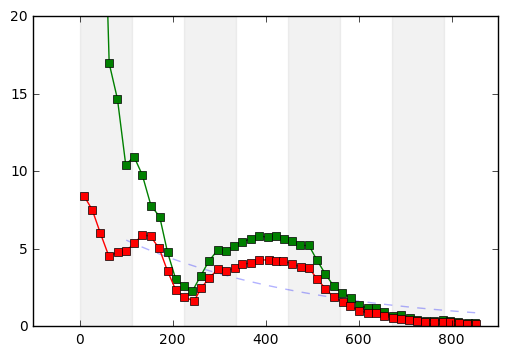

In [108]:
def func(x, a, b):
    return a * np.exp(-b * x/r25)

popt, pcov = curve_fit(func, r_HI_dens[7:], HI_dens[7:])
print popt[1]
points_ = np.linspace(100., max(r_g_dens), 100.)
plt.plot(points_, func(points_, *popt), '--', alpha=0.3)

for i in range(int(max(r_g_dens)/r25)+1):
    if i%2 == 0:
        plt.axvspan(i*r25, (i+1)*r25, color='grey', alpha=0.1)

plt.plot(r_g_dens, gas_dens, 's-')
plt.plot(r_HI_dens, HI_dens, 's-')
plt.ylim(0., 20.)
plt.show()

0.393936913332
0.522328182807
0.704234637607
0.928181569312
1.21779213928
1.03169452185
0.909573138556
0.844873384726
0.640635142398
0.794899602769


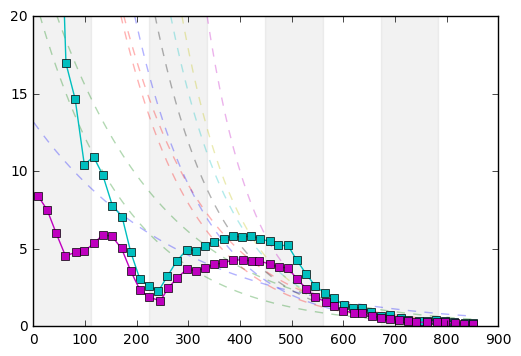

In [109]:
def func(x, a, b):
    return a * np.exp(-b * x/r25)

for i in range(15, len(r_HI_dens)-5, 3):
    popt, pcov = curve_fit(func, r_HI_dens[i:], HI_dens[i:])
    print popt[1]
    points_ = np.linspace(1., max(r_g_dens), 100.)
    plt.plot(points_, func(points_, *popt), '--', alpha=0.3)

for i in range(int(max(r_g_dens)/r25)+1):
    if i%2 == 0:
        plt.axvspan(i*r25, (i+1)*r25, color='grey', alpha=0.1)

plt.plot(r_g_dens, gas_dens, 's-')
plt.plot(r_HI_dens, HI_dens, 's-')
plt.ylim(0., 20.)
plt.show()

### Сравнение с Romeo Falstad 2013

In [99]:
import scipy.interpolate

y_interp = scipy.interpolate.interp1d(list(r_mol_dens), list(mol_dens))

def y_interp_(r):
    if r <= min(r_mol_dens):
        return y_interp(min(r_mol_dens))
    elif r < max(r_mol_dens):
        return y_interp(r)
    else:
        return 0.

# r_HI_dens, HI_dens = [l/scale for l in r_g_dens[:48]], gas_dens[:48]
# r_mol_dens, mol_dens = [l/scale for l in r_g_dens[48:56]], gas_dens[48:56]

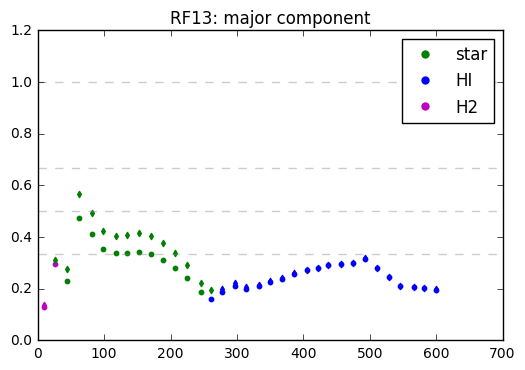

In [117]:
romeo_min = []
for r, g in zip(r_HI_dens, HI_dens)[:-14]:
    rom, _ = romeo_Qinv(r=r, epicycl=epicyclicFreq_real, sound_vel=11., sigma_R=sig_R_maj_max, 
           star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), HI_density=He_coeff*g, CO_density=y_interp_(r), 
                     alpha=0.3, scale=scale, gas_approx=spl_gas)
    romeo_min.append(rom)
    if _ == 'star':
        color = 'g' 
    elif _ == 'HI':
        color = 'b'
    else:
        color = 'm'
    plt.scatter(r, rom, 10, marker='o', color=color)


invQg, invQs, invQeff_min = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=spl_gas,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_max,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))


romeo_max = []
for r, g in zip(r_HI_dens, HI_dens)[:-14]:
    rom, _ = romeo_Qinv(r=r, epicycl=epicyclicFreq_real, sound_vel=11., sigma_R=sig_R_maj_min, 
           star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I'), HI_density=He_coeff*g, CO_density=y_interp_(r), 
                     alpha=0.7, scale=scale, gas_approx=spl_gas)
    romeo_max.append(rom)
    if _ == 'star':
        color = 'g' 
    elif _ == 'HI':
        color = 'b'
    else:
        color = 'm'
    plt.scatter(r, rom, 10, marker = 'd', color=color)


invQg, invQs, invQeff_max = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                epicycl=epicyclicFreq_real, 
                                gas_approx=spl_gas,
                                sound_vel=sound_vel, 
                                scale=scale,
                                sigma=sig_R_maj_min,
                                star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))


plot_Q_levels(plt.gca(), [1., 1.5, 2., 3.])
plt.xlim(0)
plt.ylim(0)
plt.gca().legend([matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='g', mec='none', marker='o'), 
                  matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='b', mec='none', marker='o'), 
                  matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='m', mec='none', marker='o')], 
                 ['star', 'HI', 'H2'], numpoints=1, markerscale=1, loc='upper right') #add custom legend
plt.title('RF13: major component')
plt.show()

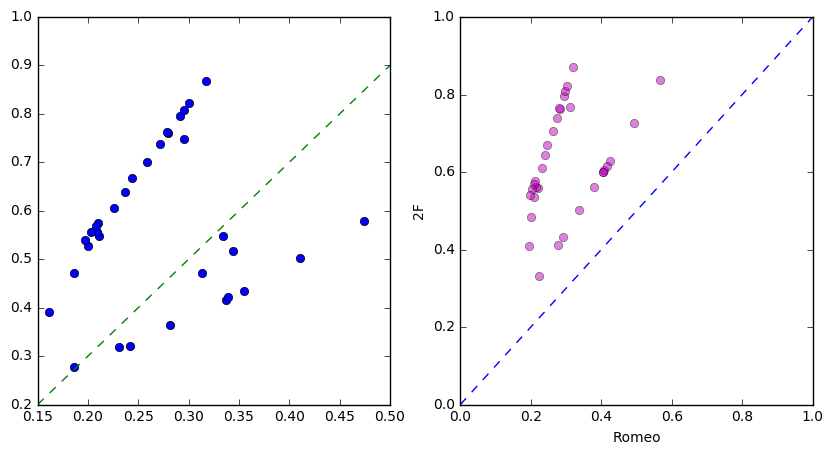

In [118]:
fig = plt.figure(figsize=[10, 5])
ax = plt.subplot(121)
ax.plot(romeo_min[1:], invQeff_min, 'o')
ax.plot(ax.get_xlim(), ax.get_ylim(), '--')
ax = plt.subplot(122)
ax.plot(romeo_max[1:], invQeff_max, 'o', color='m', alpha=0.5)
plt.xlabel('Romeo')
plt.ylabel('2F')
plt.xlim(0., 1.)
plt.ylim(0., 1.)
ax.plot(ax.get_xlim(), ax.get_ylim(), '--');

In [119]:
zip(romeo_min[1:], invQeff_min)

[(0.2951396961089523, 0.74836379450522839),
 (0.2307364592337777, 0.31793177792098726),
 (0.47379579103784458, 0.57841984153485149),
 (0.41067770507568302, 0.50213076718492788),
 (0.3550353703453778, 0.43379192951306678),
 (0.33743305197201018, 0.4147445101584295),
 (0.33931564337731218, 0.42235483483702757),
 (0.34417541538247731, 0.51612697584244682),
 (0.33442652506142001, 0.54817423898290218),
 (0.31325982101679034, 0.47190852582029535),
 (0.28107473245659076, 0.36362392277163991),
 (0.24209274288490965, 0.3207367167532979),
 (0.18564849699644542, 0.2779850559065149),
 (0.16143974698031516, 0.3914671683190602),
 (0.18625641196165527, 0.47138256288196573),
 (0.21052412274593452, 0.54820254119400413),
 (0.20047109085574538, 0.52688078959941431),
 (0.20926565971424529, 0.55634074940375),
 (0.22603858009097771, 0.60598388013201443),
 (0.23719388610285266, 0.63949603576931957),
 (0.25892071308873904, 0.70163940055938034),
 (0.27143374770992851, 0.73805777834273179),
 (0.2792458198480501

In [120]:
zip(romeo_max[1:], invQeff_max)

[(0.31034348001073592, 0.76862600019376015),
 (0.27729875586663189, 0.41044136311771195),
 (0.56656778261662566, 0.83714095548877632),
 (0.4916372847033233, 0.72671149557455061),
 (0.42480969523759649, 0.62781455494430194),
 (0.40540669050421735, 0.60019193187059483),
 (0.40781923672601073, 0.60387800063142416),
 (0.41515591382769523, 0.6160632640058662),
 (0.40419117325752041, 0.6006424706733916),
 (0.37790098958704788, 0.56081608593308974),
 (0.33805509862868111, 0.50076053761627237),
 (0.29129924329417478, 0.43160734444807813),
 (0.22392837820400668, 0.332287504026479),
 (0.19428532974149768, 0.40859486014841728),
 (0.19956923709885027, 0.48436815819071344),
 (0.2205355654650428, 0.55783258308118067),
 (0.20841963310717243, 0.53449372004338913),
 (0.21549387140432036, 0.56227517001969141),
 (0.23112038853792605, 0.6108081813775692),
 (0.24135251137007649, 0.64343430529795664),
 (0.26229988140316368, 0.7048325780009228),
 (0.27415979273004032, 0.7406300864938371),
 (0.281524955398798

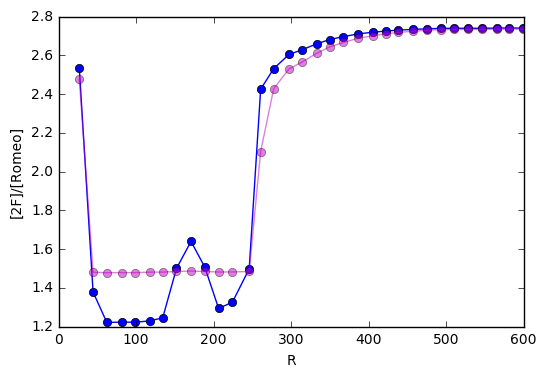

In [121]:
plt.plot(r_HI_dens[1:-14], [l[1]/l[0] for l in zip(romeo_min[1:], invQeff_min)], 'o-')
plt.plot(r_HI_dens[1:-14], [l[1]/l[0] for l in zip(romeo_max[1:], invQeff_max)], 'o-', color='m', alpha=0.5)
plt.xlabel('R')
plt.ylabel('[2F]/[Romeo]');

### Влияние параметров на результат

Влияние скорости звука:

In [122]:
%%time
sound_rel = []
for c in np.linspace(4., 20., 20):
    invQg, invQs, invQeff_min = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                    epicycl=epicyclicFreq_real, 
                                    gas_approx=spl_gas,
                                    sound_vel=c, 
                                    scale=scale,
                                    sigma=sig_R_maj_max,
                                    star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))

    invQg, invQs, invQeff_max = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                    epicycl=epicyclicFreq_real, 
                                    gas_approx=spl_gas,
                                    sound_vel=c, 
                                    scale=scale,
                                    sigma=sig_R_maj_min,
                                    star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), M_to_L_I, 'I')))

    sound_rel.append((invQeff_min, invQeff_max))

Wall time: 12min 15s


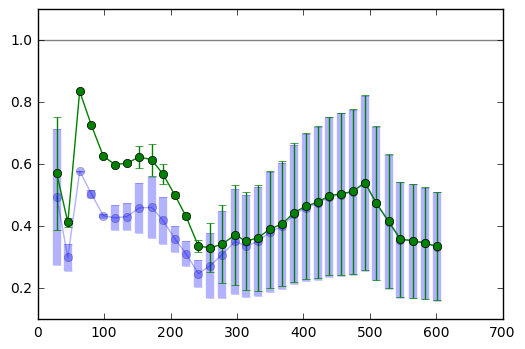

In [123]:
rr = zip(*zip(r_g_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14])[0]
qmins = []
qmaxs = []
for ind, rrr in enumerate(rr):
    qmin = [sound_rel[l][0][ind] for l in range(20)]
    qmax = [sound_rel[l][1][ind] for l in range(20)]
    qmins.append((np.mean(qmin), np.std(qmin)))
    qmaxs.append((np.mean(qmax), np.std(qmax)))
plt.errorbar(rr, zip(*qmins)[0], fmt='o-', yerr=zip(*qmins)[1], elinewidth=6, alpha=0.3);
plt.errorbar(rr, zip(*qmaxs)[0], fmt='o-', yerr=zip(*qmaxs)[1])
plt.axhline(y=1., ls='-', color='grey');

Влияние изменения M/L:

In [126]:
%%time

sound_rel = [] #на самом деле M/L rel
for c in np.linspace(0.6, 10., 20):
    invQg, invQs, invQeff_min = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                    epicycl=epicyclicFreq_real, 
                                    gas_approx=spl_gas,
                                    sound_vel=sound_vel, 
                                    scale=scale,
                                    sigma=sig_R_maj_max,
                                    star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), c, 'I')))

    invQg, invQs, invQeff_max = zip(*get_invQeff_from_data(gas_data=zip(r_HI_dens, [y_interp_(l[0]) + He_coeff*l[1] for l in zip(r_HI_dens, HI_dens)])[1:-14], 
                                    epicycl=epicyclicFreq_real, 
                                    gas_approx=spl_gas,
                                    sound_vel=sound_vel, 
                                    scale=scale,
                                    sigma=sig_R_maj_min,
                                    star_density=lambda l: surf_density(mu_disc(l, mu0=mu0d_I, h=h_disc_I), c, 'I')))

    sound_rel.append((invQeff_min, invQeff_max))

Wall time: 12min 16s


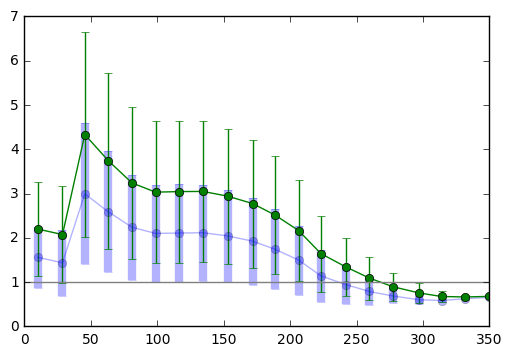

In [127]:
rr = zip(*total_gas_data)[0]
qmins = []
qmaxs = []
for ind, rrr in enumerate(rr):
    qmin = [sound_rel[l][0][ind] for l in range(20)]
    qmax = [sound_rel[l][1][ind] for l in range(20)]
    qmins.append((np.mean(qmin), np.std(qmin)))
    qmaxs.append((np.mean(qmax), np.std(qmax)))
plt.errorbar(rr, zip(*qmins)[0], fmt='o-', yerr=zip(*qmins)[1], elinewidth=6, alpha=0.3);
plt.errorbar(rr, zip(*qmaxs)[0], fmt='o-', yerr=zip(*qmaxs)[1])
plt.axhline(y=1., ls='-', color='grey');

In [53]:
qg = 6.16
qs = 11.06
s = 0.03587

def predict_hydro_unstable_Qs(Qg, s):
    '''Рассчитывает величину Qs, при которой достигается минимальная неустойчивость.
    Для этого выражения для двухжидкостной неуст в кинематич. приближении приравнивается 1 
    и максимум выражения ниже и есть искомое.'''
    fuu = lambda l: 2*k*Qg*(1+k**2*s**2)/(1+k**2)/(Qg+Qg*k**2*s**2 - 2*s*k)
    candidate_Qs = max([fuu(k) for k in np.arange(0.01, 60000., 1.)])
    Qeff = findInvKinemQeffBrute(candidate_Qs, Qg, s, np.arange(0.01, 60000., 1.))[0]
    assert abs(Qeff-1) < 0.2
    return candidate_Qs

In [54]:
predict_hydro_unstable_Qs(qg, s)

1.0118366914349535

In [55]:
Qgs = []
Qss = []
invQeff = []
for r, gd in zip(r_g_dens, gas_dens)[1:7]: #только до 90" берем, дальне нет данных по дисперсии
    Qgs.append(Qg(epicycl=epicyclicFreq_real(gas_approx, r, scale), sound_vel=sound_vel, gas_density=gd*He_coeff))
    Qss.append(predict_hydro_unstable_Qs(Qgs[-1], sound_vel/sig_R_approx(r)))
    qeff = findInvHydroQeffBrentq(Qss[-1], Qgs[-1], sound_vel/sig_R_approx(r), np.arange(0.01, 60000., 1.))
    print 'Qs = {:2.2f}; Qg = {:2.2f}; Qeff = {:2.2f}'.format(Qss[-1], Qgs[-1], 1./qeff[1])
    invQeff.append(qeff)

NameError: name 'sig_R_approx' is not defined

In [ ]:
plt.plot(r_g_dens[1:7], map(lambda l: 1./l, Qgs), '.-', label='Qg')
plt.plot(r_g_dens[1:7], zip(*invQeff)[1], 'v-', label='Qeff')
plt.ylim(0., 1.)
plt.xlim(0., 8./0.072)
plt.legend()
plt.show()

In [3]:
# %matplotlib notebook

<IPython.core.display.Javascript object>


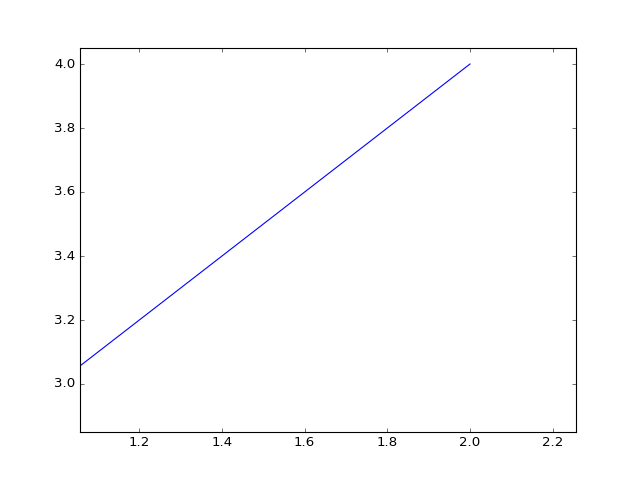

In [6]:
# import matplotlib.pylab as plt
# plt.plot([1,2], [3,4])

In [7]:
import ipykernel

In [8]:
ipykernel.version_info

(4, 5, 0)